# 🧱 DCGAN - Bricks Data

In this notebook, we'll walk through the steps required to train your own DCGAN on the bricks dataset

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

def sample_batch(dataset):
    batch = dataset.take(1).get_single_element()
    if isinstance(batch, tuple):
        batch = batch[0]
    return batch.numpy()


def display(
    images, n=10, size=(20, 3), cmap="gray_r", as_type="float32", save_to=None
):
    """
    Displays n random images from each one of the supplied arrays.
    """
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0

    plt.figure(figsize=size)
    for i in range(n):
        _ = plt.subplot(1, n, i + 1)
        plt.imshow(images[i].astype(as_type), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to)
        print(f"\nSaved to {save_to}")

    plt.show()

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 300
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [3]:
train_data = utils.image_dataset_from_directory(
    "../../../data/lego-brick-images/dataset/",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 40000 files belonging to 1 classes.


2023-07-21 09:58:43.865418: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Max
2023-07-21 09:58:43.865445: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 32.00 GB
2023-07-21 09:58:43.865453: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 10.67 GB
2023-07-21 09:58:43.865495: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-21 09:58:43.865514: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [5]:
train_sample = sample_batch(train)

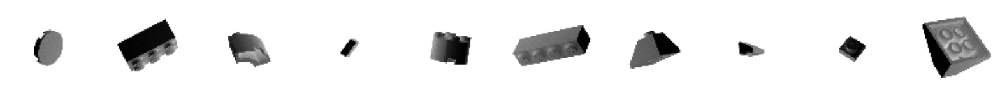

In [6]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [7]:
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        1024      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization (Batch  (None, 16, 16, 128)       512       
 Normalization)                                                  
                                                             

In [8]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 4, 4, 512)         819200    
 anspose)                                                        
                                                                 
 batch_normalization_3 (Bat  (None, 4, 4, 512)         2048      
 chNormalization)                                                
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 8, 8, 256)         2097

In [9]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            )
            real_predictions = self.discriminator(real_images, training=True)
            fake_predictions = self.discriminator(
                generated_images, training=True
            )

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [10]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [11]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [12]:
dcgan.compile(
    d_optimizer=optimizers.legacy.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.legacy.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [13]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )

Epoch 1/300


2023-07-21 09:58:45.765515: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - ETA: 0s - d_loss: 0.7375 - d_real_acc: 0.6085 - d_fake_acc: 0.6231 - d_acc: 0.6158 - g_loss: 1.2424 - g_acc: 0.3769
Saved to ./output/generated_img_000.png


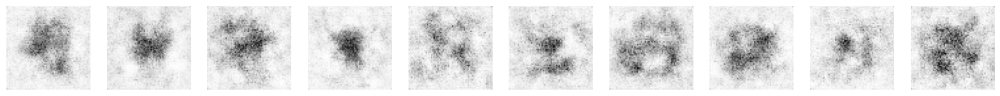

313/313 [==============================] - 43s 133ms/step - d_loss: 0.7375 - d_real_acc: 0.6085 - d_fake_acc: 0.6231 - d_acc: 0.6158 - g_loss: 1.2424 - g_acc: 0.3769
Epoch 2/300
313/313 [==============================] - ETA: 0s - d_loss: 0.5830 - d_real_acc: 0.6551 - d_fake_acc: 0.6871 - d_acc: 0.6711 - g_loss: 1.0851 - g_acc: 0.3129
Saved to ./output/generated_img_001.png


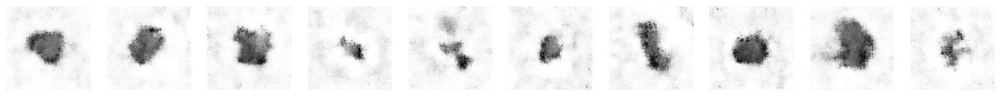

313/313 [==============================] - 42s 132ms/step - d_loss: 0.5830 - d_real_acc: 0.6551 - d_fake_acc: 0.6871 - d_acc: 0.6711 - g_loss: 1.0851 - g_acc: 0.3129
Epoch 3/300
313/313 [==============================] - ETA: 0s - d_loss: 0.5551 - d_real_acc: 0.6679 - d_fake_acc: 0.7188 - d_acc: 0.6933 - g_loss: 1.1046 - g_acc: 0.2812
Saved to ./output/generated_img_002.png


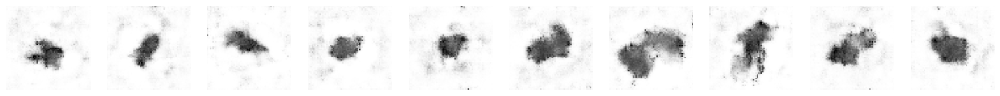

313/313 [==============================] - 41s 131ms/step - d_loss: 0.5551 - d_real_acc: 0.6679 - d_fake_acc: 0.7188 - d_acc: 0.6933 - g_loss: 1.1046 - g_acc: 0.2812
Epoch 4/300
313/313 [==============================] - ETA: 0s - d_loss: 0.5223 - d_real_acc: 0.6856 - d_fake_acc: 0.7399 - d_acc: 0.7128 - g_loss: 1.1771 - g_acc: 0.2601
Saved to ./output/generated_img_003.png


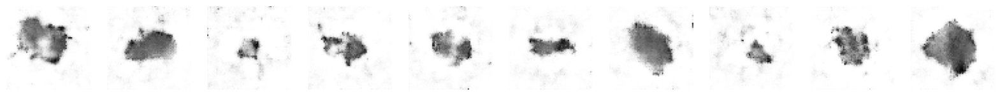

313/313 [==============================] - 41s 131ms/step - d_loss: 0.5223 - d_real_acc: 0.6856 - d_fake_acc: 0.7399 - d_acc: 0.7128 - g_loss: 1.1771 - g_acc: 0.2601
Epoch 5/300
313/313 [==============================] - ETA: 0s - d_loss: 0.5143 - d_real_acc: 0.6899 - d_fake_acc: 0.7364 - d_acc: 0.7131 - g_loss: 1.2134 - g_acc: 0.2636
Saved to ./output/generated_img_004.png


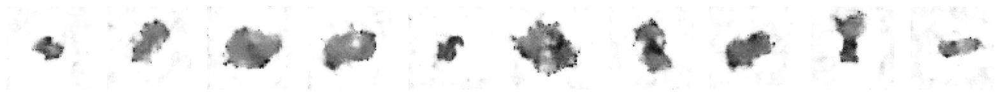

313/313 [==============================] - 271s 867ms/step - d_loss: 0.5143 - d_real_acc: 0.6899 - d_fake_acc: 0.7364 - d_acc: 0.7131 - g_loss: 1.2134 - g_acc: 0.2636
Epoch 6/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4934 - d_real_acc: 0.7036 - d_fake_acc: 0.7658 - d_acc: 0.7347 - g_loss: 1.2696 - g_acc: 0.2342
Saved to ./output/generated_img_005.png


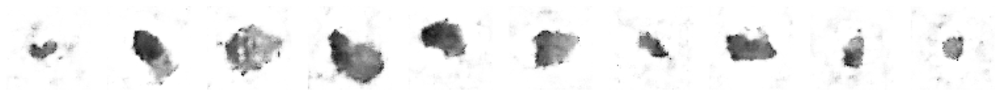

313/313 [==============================] - 184s 589ms/step - d_loss: 0.4934 - d_real_acc: 0.7036 - d_fake_acc: 0.7658 - d_acc: 0.7347 - g_loss: 1.2696 - g_acc: 0.2342
Epoch 7/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4870 - d_real_acc: 0.7086 - d_fake_acc: 0.7610 - d_acc: 0.7348 - g_loss: 1.3042 - g_acc: 0.2390
Saved to ./output/generated_img_006.png


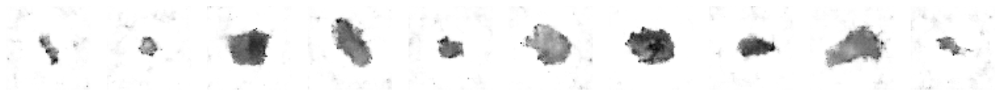

313/313 [==============================] - 263s 839ms/step - d_loss: 0.4870 - d_real_acc: 0.7086 - d_fake_acc: 0.7610 - d_acc: 0.7348 - g_loss: 1.3042 - g_acc: 0.2390
Epoch 8/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4579 - d_real_acc: 0.7221 - d_fake_acc: 0.7859 - d_acc: 0.7540 - g_loss: 1.3735 - g_acc: 0.2141
Saved to ./output/generated_img_007.png


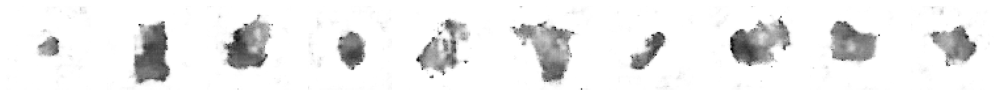

313/313 [==============================] - 114s 364ms/step - d_loss: 0.4579 - d_real_acc: 0.7221 - d_fake_acc: 0.7859 - d_acc: 0.7540 - g_loss: 1.3735 - g_acc: 0.2141
Epoch 9/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4394 - d_real_acc: 0.7322 - d_fake_acc: 0.7993 - d_acc: 0.7657 - g_loss: 1.4156 - g_acc: 0.2007
Saved to ./output/generated_img_008.png


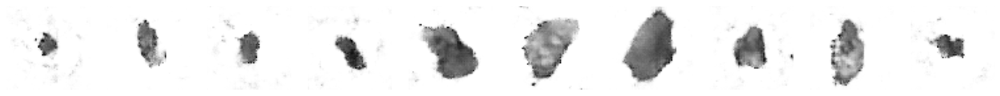

313/313 [==============================] - 41s 130ms/step - d_loss: 0.4394 - d_real_acc: 0.7322 - d_fake_acc: 0.7993 - d_acc: 0.7657 - g_loss: 1.4156 - g_acc: 0.2007
Epoch 10/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4238 - d_real_acc: 0.7413 - d_fake_acc: 0.7994 - d_acc: 0.7703 - g_loss: 1.4881 - g_acc: 0.2007
Saved to ./output/generated_img_009.png


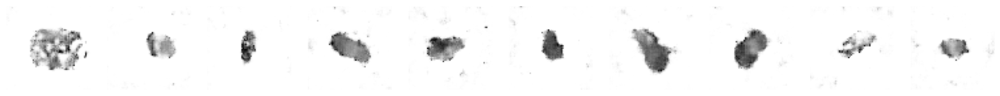

313/313 [==============================] - 42s 134ms/step - d_loss: 0.4238 - d_real_acc: 0.7413 - d_fake_acc: 0.7994 - d_acc: 0.7703 - g_loss: 1.4881 - g_acc: 0.2007
Epoch 11/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3994 - d_real_acc: 0.7511 - d_fake_acc: 0.8256 - d_acc: 0.7883 - g_loss: 1.4944 - g_acc: 0.1745
Saved to ./output/generated_img_010.png


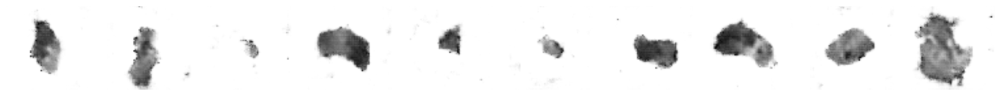

313/313 [==============================] - 41s 130ms/step - d_loss: 0.3994 - d_real_acc: 0.7511 - d_fake_acc: 0.8256 - d_acc: 0.7883 - g_loss: 1.4944 - g_acc: 0.1745
Epoch 12/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3912 - d_real_acc: 0.7561 - d_fake_acc: 0.8270 - d_acc: 0.7915 - g_loss: 1.5703 - g_acc: 0.1730
Saved to ./output/generated_img_011.png


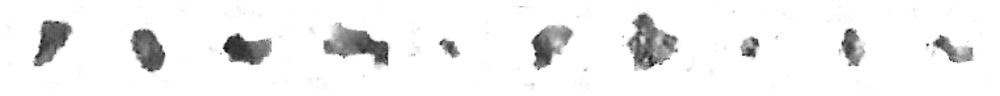

313/313 [==============================] - 42s 132ms/step - d_loss: 0.3912 - d_real_acc: 0.7561 - d_fake_acc: 0.8270 - d_acc: 0.7915 - g_loss: 1.5703 - g_acc: 0.1730
Epoch 13/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3734 - d_real_acc: 0.7653 - d_fake_acc: 0.8305 - d_acc: 0.7979 - g_loss: 1.6477 - g_acc: 0.1695
Saved to ./output/generated_img_012.png


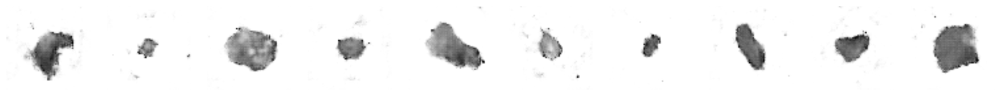

313/313 [==============================] - 43s 138ms/step - d_loss: 0.3734 - d_real_acc: 0.7653 - d_fake_acc: 0.8305 - d_acc: 0.7979 - g_loss: 1.6477 - g_acc: 0.1695
Epoch 14/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3486 - d_real_acc: 0.7749 - d_fake_acc: 0.8472 - d_acc: 0.8111 - g_loss: 1.6725 - g_acc: 0.1528
Saved to ./output/generated_img_013.png


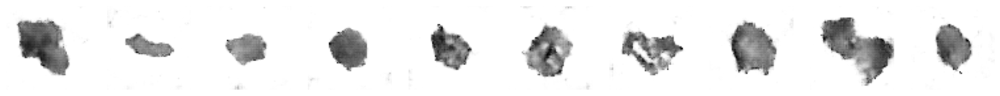

313/313 [==============================] - 44s 141ms/step - d_loss: 0.3486 - d_real_acc: 0.7749 - d_fake_acc: 0.8472 - d_acc: 0.8111 - g_loss: 1.6725 - g_acc: 0.1528
Epoch 15/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3405 - d_real_acc: 0.7789 - d_fake_acc: 0.8561 - d_acc: 0.8175 - g_loss: 1.7079 - g_acc: 0.1439
Saved to ./output/generated_img_014.png


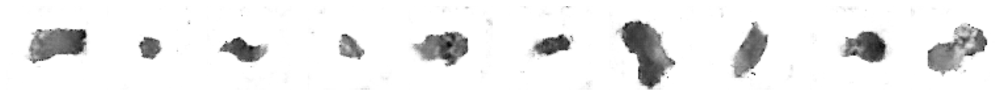

313/313 [==============================] - 45s 143ms/step - d_loss: 0.3405 - d_real_acc: 0.7789 - d_fake_acc: 0.8561 - d_acc: 0.8175 - g_loss: 1.7079 - g_acc: 0.1439
Epoch 16/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3175 - d_real_acc: 0.7914 - d_fake_acc: 0.8666 - d_acc: 0.8290 - g_loss: 1.8171 - g_acc: 0.1334
Saved to ./output/generated_img_015.png


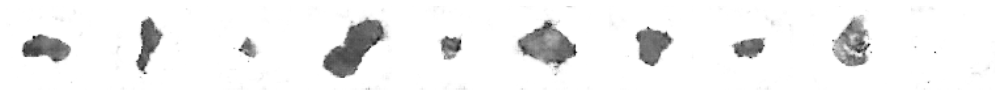

313/313 [==============================] - 45s 143ms/step - d_loss: 0.3175 - d_real_acc: 0.7914 - d_fake_acc: 0.8666 - d_acc: 0.8290 - g_loss: 1.8171 - g_acc: 0.1334
Epoch 17/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2930 - d_real_acc: 0.8005 - d_fake_acc: 0.8733 - d_acc: 0.8369 - g_loss: 1.8904 - g_acc: 0.1267
Saved to ./output/generated_img_016.png


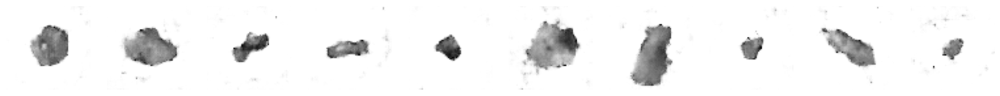

313/313 [==============================] - 45s 144ms/step - d_loss: 0.2930 - d_real_acc: 0.8005 - d_fake_acc: 0.8733 - d_acc: 0.8369 - g_loss: 1.8904 - g_acc: 0.1267
Epoch 18/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2692 - d_real_acc: 0.8092 - d_fake_acc: 0.8870 - d_acc: 0.8481 - g_loss: 1.9503 - g_acc: 0.1130
Saved to ./output/generated_img_017.png


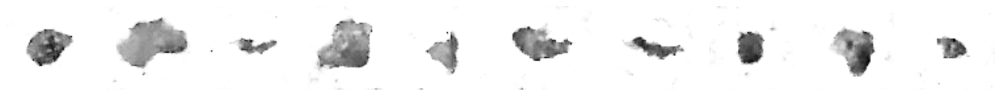

313/313 [==============================] - 46s 146ms/step - d_loss: 0.2692 - d_real_acc: 0.8092 - d_fake_acc: 0.8870 - d_acc: 0.8481 - g_loss: 1.9503 - g_acc: 0.1130
Epoch 19/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2523 - d_real_acc: 0.8121 - d_fake_acc: 0.8897 - d_acc: 0.8509 - g_loss: 2.0461 - g_acc: 0.1103
Saved to ./output/generated_img_018.png


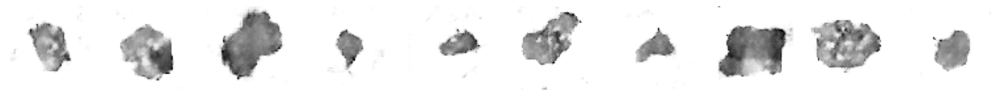

313/313 [==============================] - 46s 146ms/step - d_loss: 0.2523 - d_real_acc: 0.8121 - d_fake_acc: 0.8897 - d_acc: 0.8509 - g_loss: 2.0461 - g_acc: 0.1103
Epoch 20/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2343 - d_real_acc: 0.8206 - d_fake_acc: 0.8915 - d_acc: 0.8560 - g_loss: 2.1039 - g_acc: 0.1086
Saved to ./output/generated_img_019.png


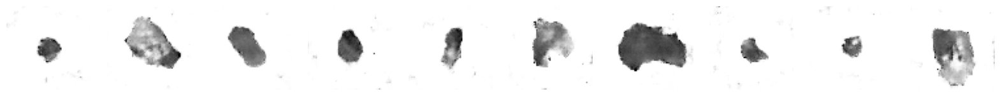

313/313 [==============================] - 46s 147ms/step - d_loss: 0.2343 - d_real_acc: 0.8206 - d_fake_acc: 0.8915 - d_acc: 0.8560 - g_loss: 2.1039 - g_acc: 0.1086
Epoch 21/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2257 - d_real_acc: 0.8222 - d_fake_acc: 0.8909 - d_acc: 0.8565 - g_loss: 2.2082 - g_acc: 0.1091
Saved to ./output/generated_img_020.png


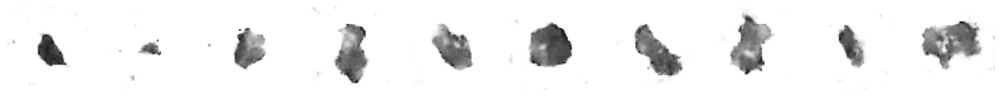

313/313 [==============================] - 46s 147ms/step - d_loss: 0.2257 - d_real_acc: 0.8222 - d_fake_acc: 0.8909 - d_acc: 0.8565 - g_loss: 2.2082 - g_acc: 0.1091
Epoch 22/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1964 - d_real_acc: 0.8334 - d_fake_acc: 0.9030 - d_acc: 0.8682 - g_loss: 2.2970 - g_acc: 0.0970
Saved to ./output/generated_img_021.png


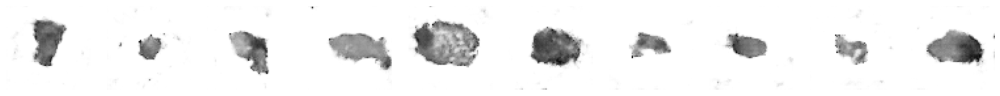

313/313 [==============================] - 47s 148ms/step - d_loss: 0.1964 - d_real_acc: 0.8334 - d_fake_acc: 0.9030 - d_acc: 0.8682 - g_loss: 2.2970 - g_acc: 0.0970
Epoch 23/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2003 - d_real_acc: 0.8314 - d_fake_acc: 0.8940 - d_acc: 0.8627 - g_loss: 2.3585 - g_acc: 0.1060
Saved to ./output/generated_img_022.png


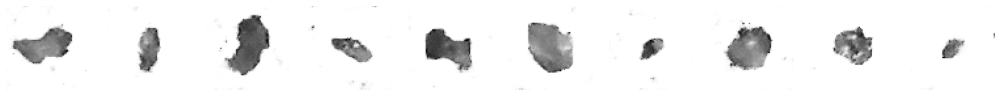

313/313 [==============================] - 203s 651ms/step - d_loss: 0.2003 - d_real_acc: 0.8314 - d_fake_acc: 0.8940 - d_acc: 0.8627 - g_loss: 2.3585 - g_acc: 0.1060
Epoch 24/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1715 - d_real_acc: 0.8433 - d_fake_acc: 0.9125 - d_acc: 0.8779 - g_loss: 2.4373 - g_acc: 0.0875
Saved to ./output/generated_img_023.png


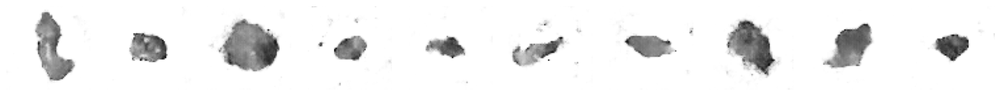

313/313 [==============================] - 41s 130ms/step - d_loss: 0.1715 - d_real_acc: 0.8433 - d_fake_acc: 0.9125 - d_acc: 0.8779 - g_loss: 2.4373 - g_acc: 0.0875
Epoch 25/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1584 - d_real_acc: 0.8458 - d_fake_acc: 0.9114 - d_acc: 0.8786 - g_loss: 2.5108 - g_acc: 0.0886
Saved to ./output/generated_img_024.png


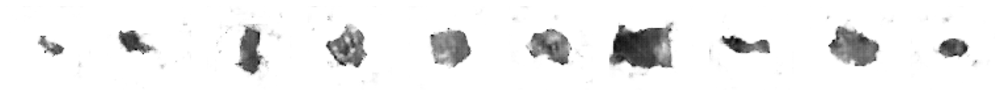

313/313 [==============================] - 41s 130ms/step - d_loss: 0.1584 - d_real_acc: 0.8458 - d_fake_acc: 0.9114 - d_acc: 0.8786 - g_loss: 2.5108 - g_acc: 0.0886
Epoch 26/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1447 - d_real_acc: 0.8499 - d_fake_acc: 0.9123 - d_acc: 0.8811 - g_loss: 2.6134 - g_acc: 0.0877
Saved to ./output/generated_img_025.png


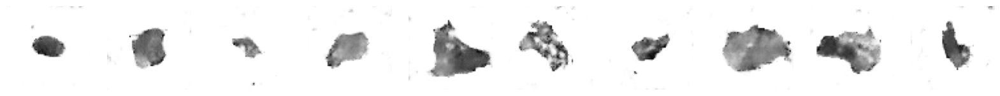

313/313 [==============================] - 43s 136ms/step - d_loss: 0.1447 - d_real_acc: 0.8499 - d_fake_acc: 0.9123 - d_acc: 0.8811 - g_loss: 2.6134 - g_acc: 0.0877
Epoch 27/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1518 - d_real_acc: 0.8492 - d_fake_acc: 0.9097 - d_acc: 0.8795 - g_loss: 2.6648 - g_acc: 0.0903
Saved to ./output/generated_img_026.png


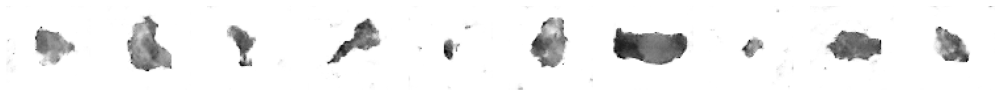

313/313 [==============================] - 46s 147ms/step - d_loss: 0.1518 - d_real_acc: 0.8492 - d_fake_acc: 0.9097 - d_acc: 0.8795 - g_loss: 2.6648 - g_acc: 0.0903
Epoch 28/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1067 - d_real_acc: 0.8606 - d_fake_acc: 0.9251 - d_acc: 0.8928 - g_loss: 2.7290 - g_acc: 0.0749
Saved to ./output/generated_img_027.png


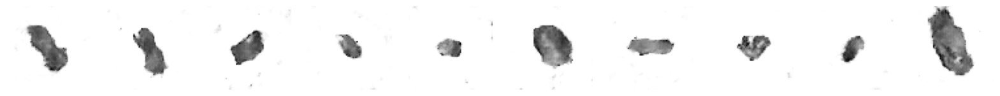

313/313 [==============================] - 48s 152ms/step - d_loss: 0.1067 - d_real_acc: 0.8606 - d_fake_acc: 0.9251 - d_acc: 0.8928 - g_loss: 2.7290 - g_acc: 0.0749
Epoch 29/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1229 - d_real_acc: 0.8585 - d_fake_acc: 0.9171 - d_acc: 0.8878 - g_loss: 2.7582 - g_acc: 0.0829
Saved to ./output/generated_img_028.png


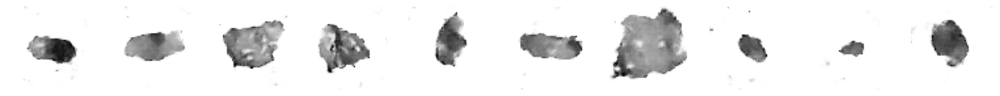

313/313 [==============================] - 50s 158ms/step - d_loss: 0.1229 - d_real_acc: 0.8585 - d_fake_acc: 0.9171 - d_acc: 0.8878 - g_loss: 2.7582 - g_acc: 0.0829
Epoch 30/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1191 - d_real_acc: 0.8553 - d_fake_acc: 0.9158 - d_acc: 0.8856 - g_loss: 2.8860 - g_acc: 0.0842
Saved to ./output/generated_img_029.png


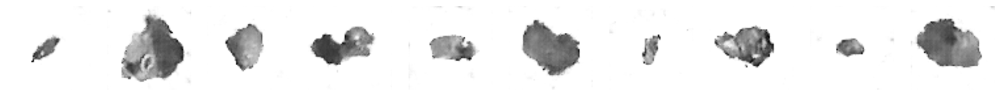

313/313 [==============================] - 47s 150ms/step - d_loss: 0.1191 - d_real_acc: 0.8553 - d_fake_acc: 0.9158 - d_acc: 0.8856 - g_loss: 2.8860 - g_acc: 0.0842
Epoch 31/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1057 - d_real_acc: 0.8596 - d_fake_acc: 0.9165 - d_acc: 0.8881 - g_loss: 2.8967 - g_acc: 0.0835
Saved to ./output/generated_img_030.png


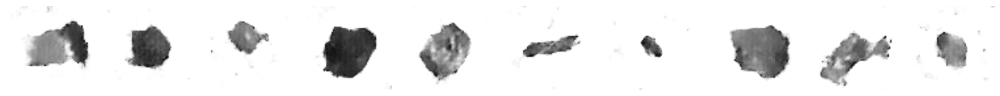

313/313 [==============================] - 47s 149ms/step - d_loss: 0.1057 - d_real_acc: 0.8596 - d_fake_acc: 0.9165 - d_acc: 0.8881 - g_loss: 2.8967 - g_acc: 0.0835
Epoch 32/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1146 - d_real_acc: 0.8566 - d_fake_acc: 0.9110 - d_acc: 0.8838 - g_loss: 2.9746 - g_acc: 0.0891
Saved to ./output/generated_img_031.png


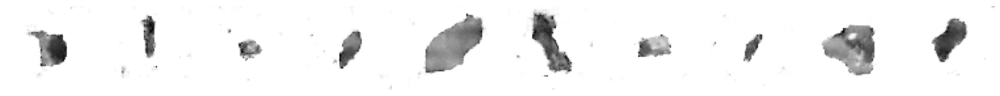

313/313 [==============================] - 47s 148ms/step - d_loss: 0.1146 - d_real_acc: 0.8566 - d_fake_acc: 0.9110 - d_acc: 0.8838 - g_loss: 2.9746 - g_acc: 0.0891
Epoch 33/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0947 - d_real_acc: 0.8646 - d_fake_acc: 0.9213 - d_acc: 0.8929 - g_loss: 3.0222 - g_acc: 0.0787
Saved to ./output/generated_img_032.png


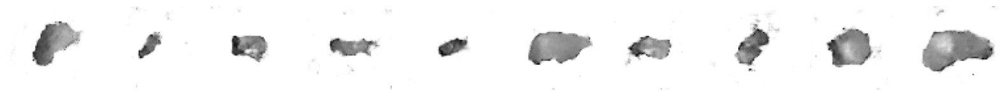

313/313 [==============================] - 46s 147ms/step - d_loss: 0.0947 - d_real_acc: 0.8646 - d_fake_acc: 0.9213 - d_acc: 0.8929 - g_loss: 3.0222 - g_acc: 0.0787
Epoch 34/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0742 - d_real_acc: 0.8695 - d_fake_acc: 0.9232 - d_acc: 0.8963 - g_loss: 3.1116 - g_acc: 0.0768
Saved to ./output/generated_img_033.png


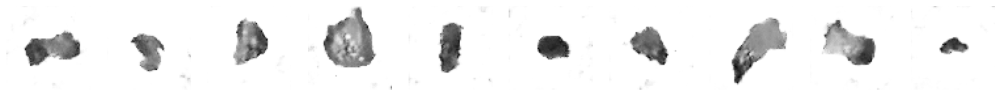

313/313 [==============================] - 47s 149ms/step - d_loss: 0.0742 - d_real_acc: 0.8695 - d_fake_acc: 0.9232 - d_acc: 0.8963 - g_loss: 3.1116 - g_acc: 0.0768
Epoch 35/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0400 - d_real_acc: 0.8773 - d_fake_acc: 0.9366 - d_acc: 0.9070 - g_loss: 3.1391 - g_acc: 0.0634
Saved to ./output/generated_img_034.png


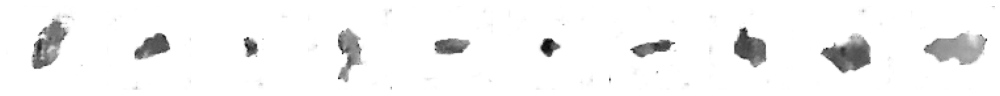

313/313 [==============================] - 47s 149ms/step - d_loss: 0.0400 - d_real_acc: 0.8773 - d_fake_acc: 0.9366 - d_acc: 0.9070 - g_loss: 3.1391 - g_acc: 0.0634
Epoch 36/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0821 - d_real_acc: 0.8655 - d_fake_acc: 0.9172 - d_acc: 0.8914 - g_loss: 3.2608 - g_acc: 0.0828
Saved to ./output/generated_img_035.png


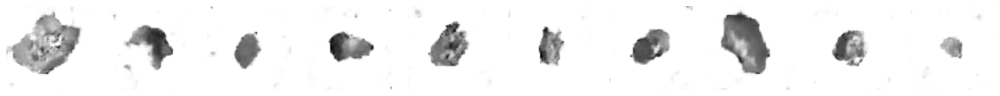

313/313 [==============================] - 46s 148ms/step - d_loss: 0.0821 - d_real_acc: 0.8655 - d_fake_acc: 0.9172 - d_acc: 0.8914 - g_loss: 3.2608 - g_acc: 0.0828
Epoch 37/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0427 - d_real_acc: 0.8759 - d_fake_acc: 0.9303 - d_acc: 0.9031 - g_loss: 3.2858 - g_acc: 0.0697
Saved to ./output/generated_img_036.png


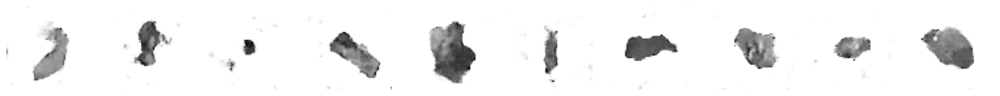

313/313 [==============================] - 46s 147ms/step - d_loss: 0.0427 - d_real_acc: 0.8759 - d_fake_acc: 0.9303 - d_acc: 0.9031 - g_loss: 3.2858 - g_acc: 0.0697
Epoch 38/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0343 - d_real_acc: 0.8800 - d_fake_acc: 0.9313 - d_acc: 0.9057 - g_loss: 3.3621 - g_acc: 0.0687
Saved to ./output/generated_img_037.png


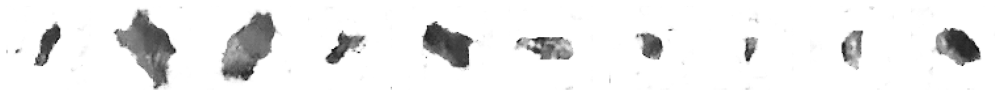

313/313 [==============================] - 46s 147ms/step - d_loss: 0.0343 - d_real_acc: 0.8800 - d_fake_acc: 0.9313 - d_acc: 0.9057 - g_loss: 3.3621 - g_acc: 0.0687
Epoch 39/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0295 - d_real_acc: 0.8803 - d_fake_acc: 0.9303 - d_acc: 0.9053 - g_loss: 3.4627 - g_acc: 0.0698
Saved to ./output/generated_img_038.png


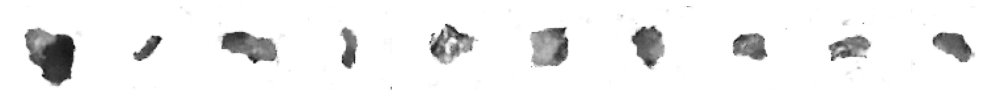

313/313 [==============================] - 46s 147ms/step - d_loss: 0.0295 - d_real_acc: 0.8803 - d_fake_acc: 0.9303 - d_acc: 0.9053 - g_loss: 3.4627 - g_acc: 0.0698
Epoch 40/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0229 - d_real_acc: 0.8820 - d_fake_acc: 0.9389 - d_acc: 0.9105 - g_loss: 3.3419 - g_acc: 0.0611
Saved to ./output/generated_img_039.png


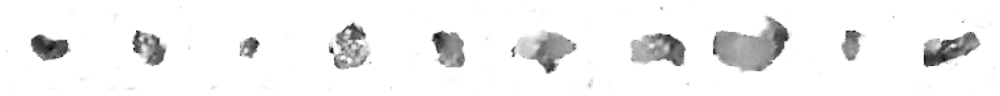

313/313 [==============================] - 46s 146ms/step - d_loss: 0.0229 - d_real_acc: 0.8820 - d_fake_acc: 0.9389 - d_acc: 0.9105 - g_loss: 3.3419 - g_acc: 0.0611
Epoch 41/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0121 - d_real_acc: 0.8813 - d_fake_acc: 0.9330 - d_acc: 0.9072 - g_loss: 3.5550 - g_acc: 0.0670
Saved to ./output/generated_img_040.png


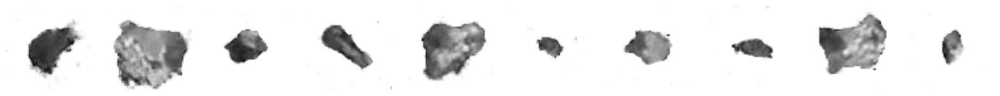

313/313 [==============================] - 46s 147ms/step - d_loss: 0.0121 - d_real_acc: 0.8813 - d_fake_acc: 0.9330 - d_acc: 0.9072 - g_loss: 3.5550 - g_acc: 0.0670
Epoch 42/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0090 - d_real_acc: 0.8822 - d_fake_acc: 0.9312 - d_acc: 0.9067 - g_loss: 3.6428 - g_acc: 0.0688
Saved to ./output/generated_img_041.png


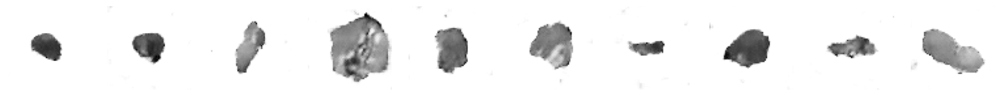

313/313 [==============================] - 48s 152ms/step - d_loss: 0.0090 - d_real_acc: 0.8822 - d_fake_acc: 0.9312 - d_acc: 0.9067 - g_loss: 3.6428 - g_acc: 0.0688
Epoch 43/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0050 - d_real_acc: 0.8867 - d_fake_acc: 0.9343 - d_acc: 0.9105 - g_loss: 3.7394 - g_acc: 0.0658
Saved to ./output/generated_img_042.png


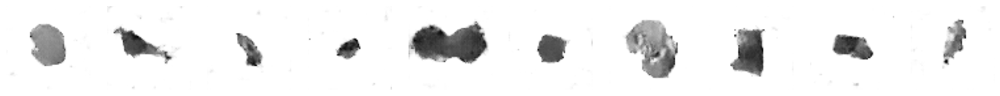

313/313 [==============================] - 48s 153ms/step - d_loss: -0.0050 - d_real_acc: 0.8867 - d_fake_acc: 0.9343 - d_acc: 0.9105 - g_loss: 3.7394 - g_acc: 0.0658
Epoch 44/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0288 - d_real_acc: 0.8941 - d_fake_acc: 0.9412 - d_acc: 0.9176 - g_loss: 3.8202 - g_acc: 0.0588
Saved to ./output/generated_img_043.png


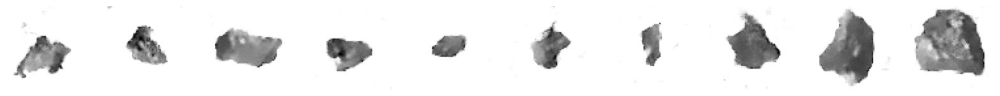

313/313 [==============================] - 49s 156ms/step - d_loss: -0.0288 - d_real_acc: 0.8941 - d_fake_acc: 0.9412 - d_acc: 0.9176 - g_loss: 3.8202 - g_acc: 0.0588
Epoch 45/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0251 - d_real_acc: 0.8805 - d_fake_acc: 0.9252 - d_acc: 0.9028 - g_loss: 3.8774 - g_acc: 0.0749
Saved to ./output/generated_img_044.png


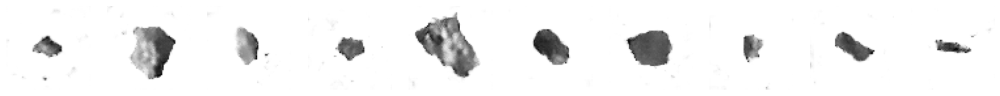

313/313 [==============================] - 49s 156ms/step - d_loss: 0.0251 - d_real_acc: 0.8805 - d_fake_acc: 0.9252 - d_acc: 0.9028 - g_loss: 3.8774 - g_acc: 0.0749
Epoch 46/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0543 - d_real_acc: 0.8980 - d_fake_acc: 0.9460 - d_acc: 0.9220 - g_loss: 3.7943 - g_acc: 0.0540
Saved to ./output/generated_img_045.png


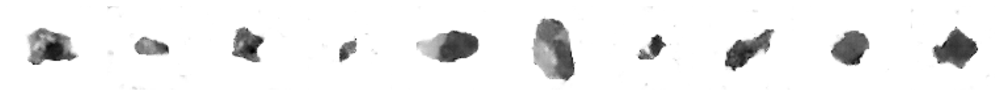

313/313 [==============================] - 50s 158ms/step - d_loss: -0.0543 - d_real_acc: 0.8980 - d_fake_acc: 0.9460 - d_acc: 0.9220 - g_loss: 3.7943 - g_acc: 0.0540
Epoch 47/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0288 - d_real_acc: 0.8904 - d_fake_acc: 0.9324 - d_acc: 0.9114 - g_loss: 4.0667 - g_acc: 0.0676
Saved to ./output/generated_img_046.png


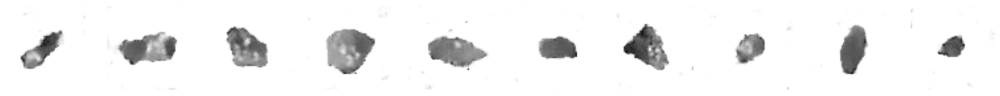

313/313 [==============================] - 51s 161ms/step - d_loss: -0.0288 - d_real_acc: 0.8904 - d_fake_acc: 0.9324 - d_acc: 0.9114 - g_loss: 4.0667 - g_acc: 0.0676
Epoch 48/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0397 - d_real_acc: 0.8926 - d_fake_acc: 0.9374 - d_acc: 0.9150 - g_loss: 4.1332 - g_acc: 0.0626
Saved to ./output/generated_img_047.png


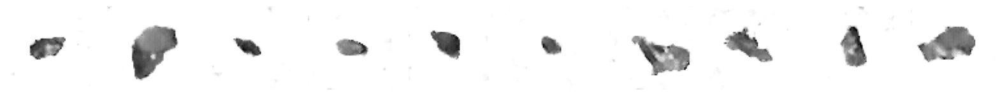

313/313 [==============================] - 49s 155ms/step - d_loss: -0.0397 - d_real_acc: 0.8926 - d_fake_acc: 0.9374 - d_acc: 0.9150 - g_loss: 4.1332 - g_acc: 0.0626
Epoch 49/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0730 - d_real_acc: 0.9006 - d_fake_acc: 0.9446 - d_acc: 0.9226 - g_loss: 4.2195 - g_acc: 0.0554
Saved to ./output/generated_img_048.png


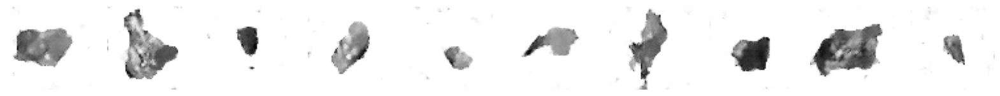

313/313 [==============================] - 49s 155ms/step - d_loss: -0.0730 - d_real_acc: 0.9006 - d_fake_acc: 0.9446 - d_acc: 0.9226 - g_loss: 4.2195 - g_acc: 0.0554
Epoch 50/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0527 - d_real_acc: 0.8952 - d_fake_acc: 0.9407 - d_acc: 0.9180 - g_loss: 4.2777 - g_acc: 0.0593
Saved to ./output/generated_img_049.png


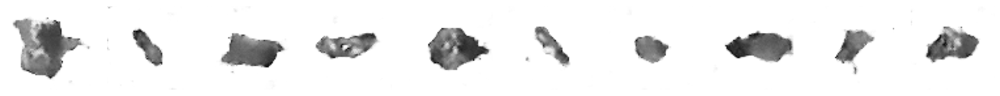

313/313 [==============================] - 48s 152ms/step - d_loss: -0.0527 - d_real_acc: 0.8952 - d_fake_acc: 0.9407 - d_acc: 0.9180 - g_loss: 4.2777 - g_acc: 0.0593
Epoch 51/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0568 - d_real_acc: 0.8974 - d_fake_acc: 0.9391 - d_acc: 0.9182 - g_loss: 4.2915 - g_acc: 0.0609
Saved to ./output/generated_img_050.png


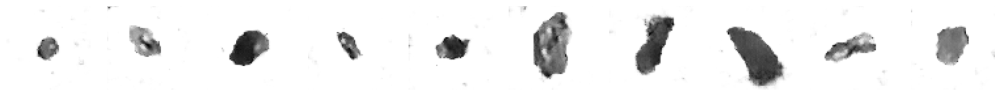

313/313 [==============================] - 48s 151ms/step - d_loss: -0.0568 - d_real_acc: 0.8974 - d_fake_acc: 0.9391 - d_acc: 0.9182 - g_loss: 4.2915 - g_acc: 0.0609
Epoch 52/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0892 - d_real_acc: 0.9020 - d_fake_acc: 0.9437 - d_acc: 0.9229 - g_loss: 4.4252 - g_acc: 0.0563
Saved to ./output/generated_img_051.png


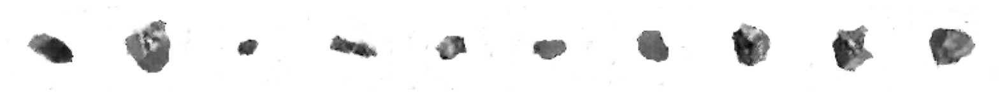

313/313 [==============================] - 50s 158ms/step - d_loss: -0.0892 - d_real_acc: 0.9020 - d_fake_acc: 0.9437 - d_acc: 0.9229 - g_loss: 4.4252 - g_acc: 0.0563
Epoch 53/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0264 - d_real_acc: 0.8936 - d_fake_acc: 0.9412 - d_acc: 0.9174 - g_loss: 3.9841 - g_acc: 0.0589
Saved to ./output/generated_img_052.png


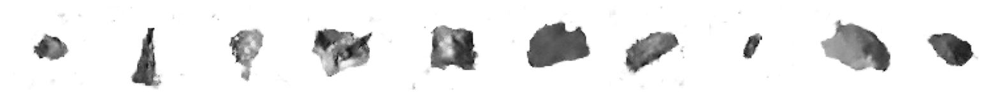

313/313 [==============================] - 53s 168ms/step - d_loss: -0.0264 - d_real_acc: 0.8936 - d_fake_acc: 0.9412 - d_acc: 0.9174 - g_loss: 3.9841 - g_acc: 0.0589
Epoch 54/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0820 - d_real_acc: 0.8999 - d_fake_acc: 0.9413 - d_acc: 0.9206 - g_loss: 4.6359 - g_acc: 0.0588
Saved to ./output/generated_img_053.png


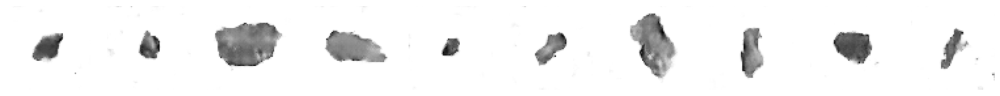

313/313 [==============================] - 55s 176ms/step - d_loss: -0.0820 - d_real_acc: 0.8999 - d_fake_acc: 0.9413 - d_acc: 0.9206 - g_loss: 4.6359 - g_acc: 0.0588
Epoch 55/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0902 - d_real_acc: 0.9039 - d_fake_acc: 0.9438 - d_acc: 0.9238 - g_loss: 4.6375 - g_acc: 0.0562
Saved to ./output/generated_img_054.png


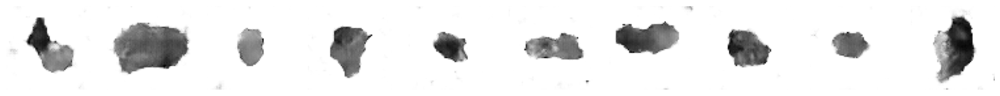

313/313 [==============================] - 48s 153ms/step - d_loss: -0.0902 - d_real_acc: 0.9039 - d_fake_acc: 0.9438 - d_acc: 0.9238 - g_loss: 4.6375 - g_acc: 0.0562
Epoch 56/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0711 - d_real_acc: 0.8980 - d_fake_acc: 0.9365 - d_acc: 0.9172 - g_loss: 4.6716 - g_acc: 0.0635
Saved to ./output/generated_img_055.png


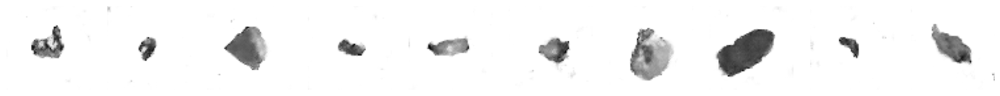

313/313 [==============================] - 48s 152ms/step - d_loss: -0.0711 - d_real_acc: 0.8980 - d_fake_acc: 0.9365 - d_acc: 0.9172 - g_loss: 4.6716 - g_acc: 0.0635
Epoch 57/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0926 - d_real_acc: 0.9022 - d_fake_acc: 0.9405 - d_acc: 0.9213 - g_loss: 4.7062 - g_acc: 0.0596
Saved to ./output/generated_img_056.png


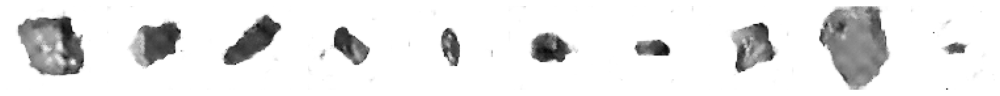

313/313 [==============================] - 47s 151ms/step - d_loss: -0.0926 - d_real_acc: 0.9022 - d_fake_acc: 0.9405 - d_acc: 0.9213 - g_loss: 4.7062 - g_acc: 0.0596
Epoch 58/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1226 - d_real_acc: 0.9102 - d_fake_acc: 0.9522 - d_acc: 0.9312 - g_loss: 4.8299 - g_acc: 0.0478
Saved to ./output/generated_img_057.png


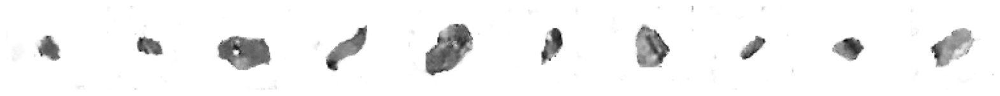

313/313 [==============================] - 47s 149ms/step - d_loss: -0.1226 - d_real_acc: 0.9102 - d_fake_acc: 0.9522 - d_acc: 0.9312 - g_loss: 4.8299 - g_acc: 0.0478
Epoch 59/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1099 - d_real_acc: 0.9056 - d_fake_acc: 0.9478 - d_acc: 0.9267 - g_loss: 4.6989 - g_acc: 0.0523
Saved to ./output/generated_img_058.png


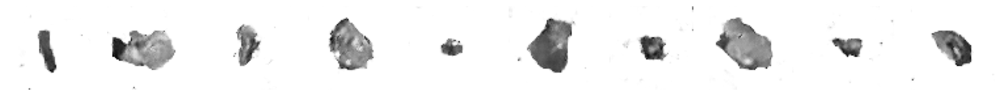

313/313 [==============================] - 47s 148ms/step - d_loss: -0.1099 - d_real_acc: 0.9056 - d_fake_acc: 0.9478 - d_acc: 0.9267 - g_loss: 4.6989 - g_acc: 0.0523
Epoch 60/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1460 - d_real_acc: 0.9134 - d_fake_acc: 0.9506 - d_acc: 0.9320 - g_loss: 4.9739 - g_acc: 0.0494
Saved to ./output/generated_img_059.png


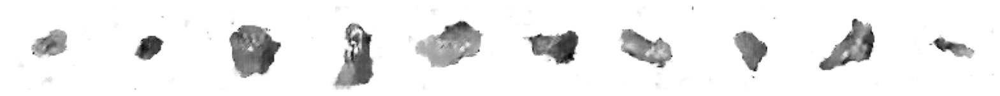

313/313 [==============================] - 47s 148ms/step - d_loss: -0.1460 - d_real_acc: 0.9134 - d_fake_acc: 0.9506 - d_acc: 0.9320 - g_loss: 4.9739 - g_acc: 0.0494
Epoch 61/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1165 - d_real_acc: 0.9078 - d_fake_acc: 0.9483 - d_acc: 0.9280 - g_loss: 4.8914 - g_acc: 0.0517
Saved to ./output/generated_img_060.png


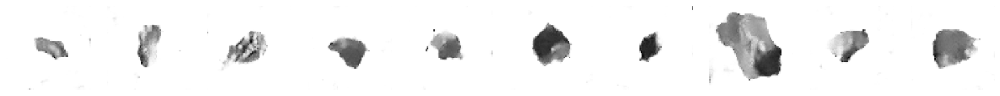

313/313 [==============================] - 50s 158ms/step - d_loss: -0.1165 - d_real_acc: 0.9078 - d_fake_acc: 0.9483 - d_acc: 0.9280 - g_loss: 4.8914 - g_acc: 0.0517
Epoch 62/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0749 - d_real_acc: 0.9009 - d_fake_acc: 0.9430 - d_acc: 0.9220 - g_loss: 4.6062 - g_acc: 0.0570
Saved to ./output/generated_img_061.png


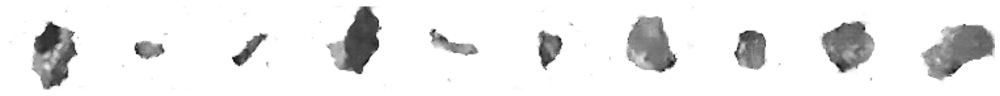

313/313 [==============================] - 52s 164ms/step - d_loss: -0.0749 - d_real_acc: 0.9009 - d_fake_acc: 0.9430 - d_acc: 0.9220 - g_loss: 4.6062 - g_acc: 0.0570
Epoch 63/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1436 - d_real_acc: 0.9102 - d_fake_acc: 0.9477 - d_acc: 0.9289 - g_loss: 5.1926 - g_acc: 0.0523
Saved to ./output/generated_img_062.png


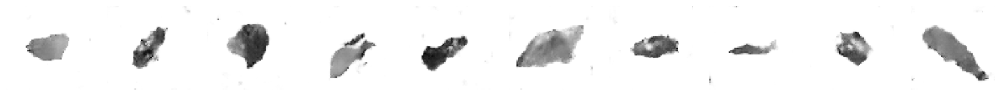

313/313 [==============================] - 52s 165ms/step - d_loss: -0.1436 - d_real_acc: 0.9102 - d_fake_acc: 0.9477 - d_acc: 0.9289 - g_loss: 5.1926 - g_acc: 0.0523
Epoch 64/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1285 - d_real_acc: 0.9094 - d_fake_acc: 0.9474 - d_acc: 0.9284 - g_loss: 5.0536 - g_acc: 0.0526
Saved to ./output/generated_img_063.png


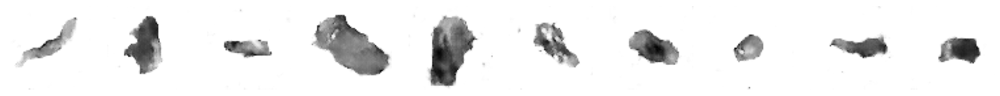

313/313 [==============================] - 48s 152ms/step - d_loss: -0.1285 - d_real_acc: 0.9094 - d_fake_acc: 0.9474 - d_acc: 0.9284 - g_loss: 5.0536 - g_acc: 0.0526
Epoch 65/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1196 - d_real_acc: 0.9061 - d_fake_acc: 0.9455 - d_acc: 0.9258 - g_loss: 5.0597 - g_acc: 0.0545
Saved to ./output/generated_img_064.png


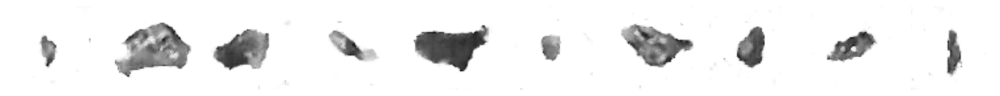

313/313 [==============================] - 47s 151ms/step - d_loss: -0.1196 - d_real_acc: 0.9061 - d_fake_acc: 0.9455 - d_acc: 0.9258 - g_loss: 5.0597 - g_acc: 0.0545
Epoch 66/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1326 - d_real_acc: 0.9094 - d_fake_acc: 0.9482 - d_acc: 0.9288 - g_loss: 5.1391 - g_acc: 0.0518
Saved to ./output/generated_img_065.png


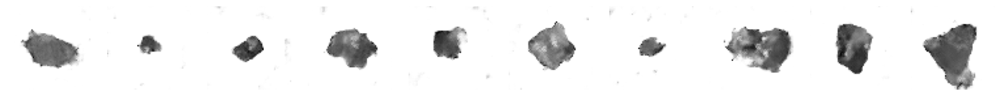

313/313 [==============================] - 56s 178ms/step - d_loss: -0.1326 - d_real_acc: 0.9094 - d_fake_acc: 0.9482 - d_acc: 0.9288 - g_loss: 5.1391 - g_acc: 0.0518
Epoch 67/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1706 - d_real_acc: 0.9182 - d_fake_acc: 0.9571 - d_acc: 0.9376 - g_loss: 5.1570 - g_acc: 0.0430
Saved to ./output/generated_img_066.png


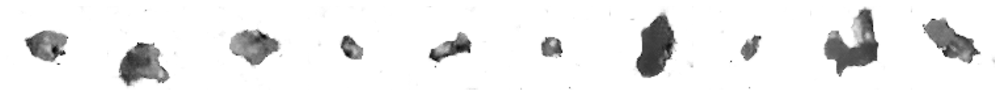

313/313 [==============================] - 48s 153ms/step - d_loss: -0.1706 - d_real_acc: 0.9182 - d_fake_acc: 0.9571 - d_acc: 0.9376 - g_loss: 5.1570 - g_acc: 0.0430
Epoch 68/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1225 - d_real_acc: 0.9076 - d_fake_acc: 0.9436 - d_acc: 0.9256 - g_loss: 5.3356 - g_acc: 0.0564
Saved to ./output/generated_img_067.png


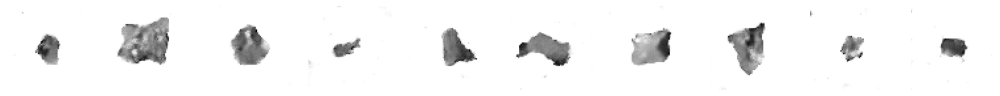

313/313 [==============================] - 49s 154ms/step - d_loss: -0.1225 - d_real_acc: 0.9076 - d_fake_acc: 0.9436 - d_acc: 0.9256 - g_loss: 5.3356 - g_acc: 0.0564
Epoch 69/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1072 - d_real_acc: 0.9045 - d_fake_acc: 0.9420 - d_acc: 0.9232 - g_loss: 5.2609 - g_acc: 0.0580
Saved to ./output/generated_img_068.png


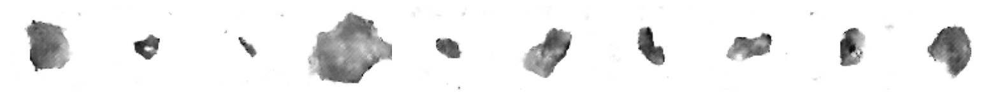

313/313 [==============================] - 48s 152ms/step - d_loss: -0.1072 - d_real_acc: 0.9045 - d_fake_acc: 0.9420 - d_acc: 0.9232 - g_loss: 5.2609 - g_acc: 0.0580
Epoch 70/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1295 - d_real_acc: 0.9108 - d_fake_acc: 0.9528 - d_acc: 0.9318 - g_loss: 4.9685 - g_acc: 0.0472
Saved to ./output/generated_img_069.png


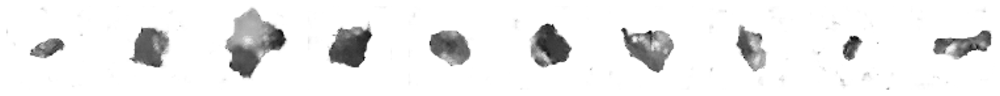

313/313 [==============================] - 48s 152ms/step - d_loss: -0.1295 - d_real_acc: 0.9108 - d_fake_acc: 0.9528 - d_acc: 0.9318 - g_loss: 4.9685 - g_acc: 0.0472
Epoch 71/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1686 - d_real_acc: 0.9154 - d_fake_acc: 0.9553 - d_acc: 0.9354 - g_loss: 5.3447 - g_acc: 0.0447
Saved to ./output/generated_img_070.png


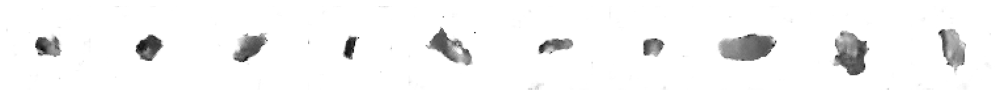

313/313 [==============================] - 48s 152ms/step - d_loss: -0.1686 - d_real_acc: 0.9154 - d_fake_acc: 0.9553 - d_acc: 0.9354 - g_loss: 5.3447 - g_acc: 0.0447
Epoch 72/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1723 - d_real_acc: 0.9148 - d_fake_acc: 0.9543 - d_acc: 0.9345 - g_loss: 5.5222 - g_acc: 0.0457
Saved to ./output/generated_img_071.png


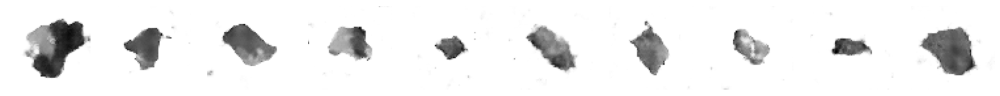

313/313 [==============================] - 47s 149ms/step - d_loss: -0.1723 - d_real_acc: 0.9148 - d_fake_acc: 0.9543 - d_acc: 0.9345 - g_loss: 5.5222 - g_acc: 0.0457
Epoch 73/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1570 - d_real_acc: 0.9129 - d_fake_acc: 0.9532 - d_acc: 0.9330 - g_loss: 5.3009 - g_acc: 0.0469
Saved to ./output/generated_img_072.png


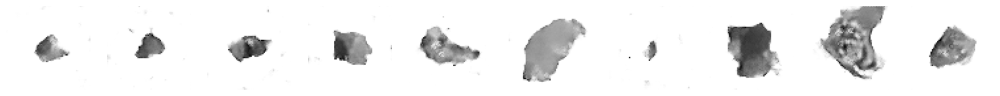

313/313 [==============================] - 48s 152ms/step - d_loss: -0.1570 - d_real_acc: 0.9129 - d_fake_acc: 0.9532 - d_acc: 0.9330 - g_loss: 5.3009 - g_acc: 0.0469
Epoch 74/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1096 - d_real_acc: 0.9049 - d_fake_acc: 0.9404 - d_acc: 0.9227 - g_loss: 5.5609 - g_acc: 0.0596
Saved to ./output/generated_img_073.png


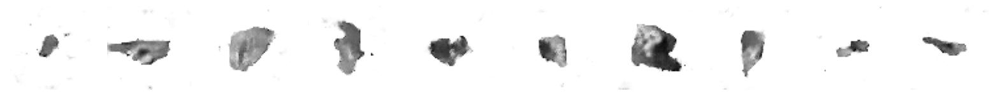

313/313 [==============================] - 46s 148ms/step - d_loss: -0.1096 - d_real_acc: 0.9049 - d_fake_acc: 0.9404 - d_acc: 0.9227 - g_loss: 5.5609 - g_acc: 0.0596
Epoch 75/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1868 - d_real_acc: 0.9195 - d_fake_acc: 0.9588 - d_acc: 0.9392 - g_loss: 5.4327 - g_acc: 0.0412
Saved to ./output/generated_img_074.png


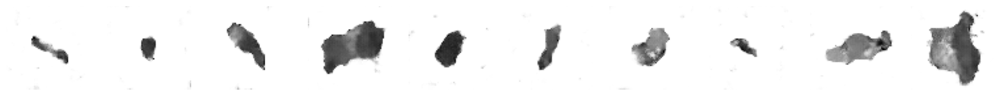

313/313 [==============================] - 48s 151ms/step - d_loss: -0.1868 - d_real_acc: 0.9195 - d_fake_acc: 0.9588 - d_acc: 0.9392 - g_loss: 5.4327 - g_acc: 0.0412
Epoch 76/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1436 - d_real_acc: 0.9086 - d_fake_acc: 0.9431 - d_acc: 0.9258 - g_loss: 5.6952 - g_acc: 0.0569
Saved to ./output/generated_img_075.png


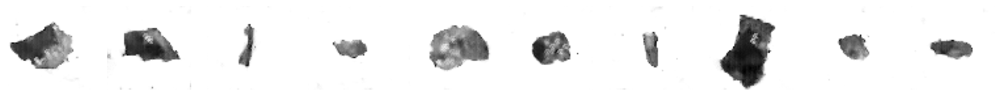

313/313 [==============================] - 48s 151ms/step - d_loss: -0.1436 - d_real_acc: 0.9086 - d_fake_acc: 0.9431 - d_acc: 0.9258 - g_loss: 5.6952 - g_acc: 0.0569
Epoch 77/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1976 - d_real_acc: 0.9186 - d_fake_acc: 0.9558 - d_acc: 0.9372 - g_loss: 5.6463 - g_acc: 0.0443
Saved to ./output/generated_img_076.png


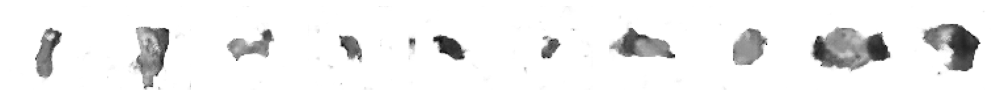

313/313 [==============================] - 47s 151ms/step - d_loss: -0.1976 - d_real_acc: 0.9186 - d_fake_acc: 0.9558 - d_acc: 0.9372 - g_loss: 5.6463 - g_acc: 0.0443
Epoch 78/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1905 - d_real_acc: 0.9208 - d_fake_acc: 0.9587 - d_acc: 0.9398 - g_loss: 5.5747 - g_acc: 0.0413
Saved to ./output/generated_img_077.png


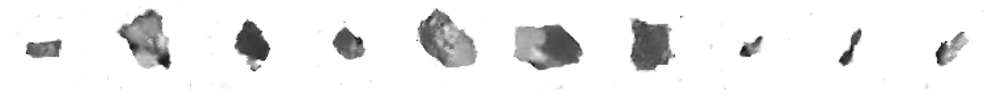

313/313 [==============================] - 47s 150ms/step - d_loss: -0.1905 - d_real_acc: 0.9208 - d_fake_acc: 0.9587 - d_acc: 0.9398 - g_loss: 5.5747 - g_acc: 0.0413
Epoch 79/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1353 - d_real_acc: 0.9116 - d_fake_acc: 0.9480 - d_acc: 0.9298 - g_loss: 5.5524 - g_acc: 0.0521
Saved to ./output/generated_img_078.png


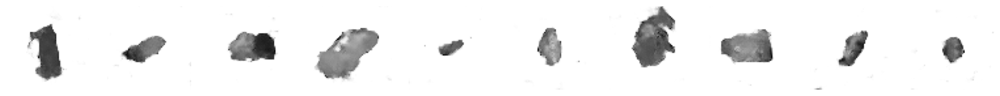

313/313 [==============================] - 47s 151ms/step - d_loss: -0.1353 - d_real_acc: 0.9116 - d_fake_acc: 0.9480 - d_acc: 0.9298 - g_loss: 5.5524 - g_acc: 0.0521
Epoch 80/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1748 - d_real_acc: 0.9158 - d_fake_acc: 0.9529 - d_acc: 0.9343 - g_loss: 5.7251 - g_acc: 0.0471
Saved to ./output/generated_img_079.png


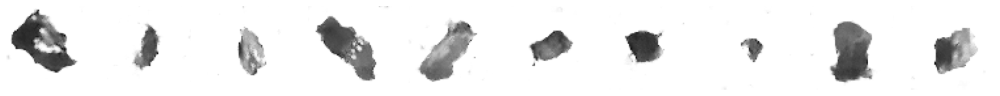

313/313 [==============================] - 47s 149ms/step - d_loss: -0.1748 - d_real_acc: 0.9158 - d_fake_acc: 0.9529 - d_acc: 0.9343 - g_loss: 5.7251 - g_acc: 0.0471
Epoch 81/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1815 - d_real_acc: 0.9148 - d_fake_acc: 0.9502 - d_acc: 0.9325 - g_loss: 5.9259 - g_acc: 0.0498
Saved to ./output/generated_img_080.png


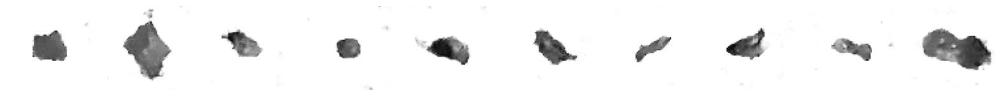

313/313 [==============================] - 47s 150ms/step - d_loss: -0.1815 - d_real_acc: 0.9148 - d_fake_acc: 0.9502 - d_acc: 0.9325 - g_loss: 5.9259 - g_acc: 0.0498
Epoch 82/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1839 - d_real_acc: 0.9174 - d_fake_acc: 0.9532 - d_acc: 0.9353 - g_loss: 5.8209 - g_acc: 0.0469
Saved to ./output/generated_img_081.png


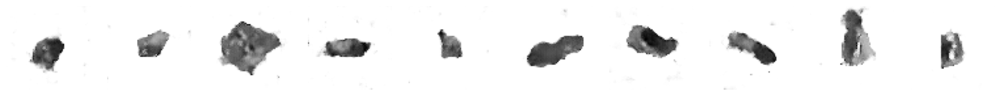

313/313 [==============================] - 47s 151ms/step - d_loss: -0.1839 - d_real_acc: 0.9174 - d_fake_acc: 0.9532 - d_acc: 0.9353 - g_loss: 5.8209 - g_acc: 0.0469
Epoch 83/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1896 - d_real_acc: 0.9155 - d_fake_acc: 0.9524 - d_acc: 0.9339 - g_loss: 5.9714 - g_acc: 0.0477
Saved to ./output/generated_img_082.png


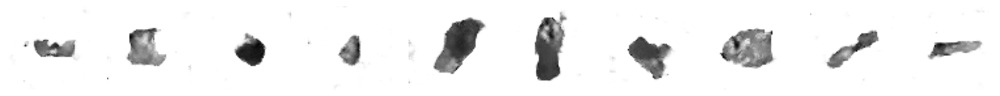

313/313 [==============================] - 47s 149ms/step - d_loss: -0.1896 - d_real_acc: 0.9155 - d_fake_acc: 0.9524 - d_acc: 0.9339 - g_loss: 5.9714 - g_acc: 0.0477
Epoch 84/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2179 - d_real_acc: 0.9222 - d_fake_acc: 0.9576 - d_acc: 0.9399 - g_loss: 6.0222 - g_acc: 0.0424
Saved to ./output/generated_img_083.png


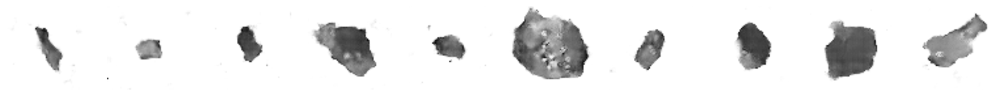

313/313 [==============================] - 47s 149ms/step - d_loss: -0.2179 - d_real_acc: 0.9222 - d_fake_acc: 0.9576 - d_acc: 0.9399 - g_loss: 6.0222 - g_acc: 0.0424
Epoch 85/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2069 - d_real_acc: 0.9202 - d_fake_acc: 0.9551 - d_acc: 0.9376 - g_loss: 6.1289 - g_acc: 0.0449
Saved to ./output/generated_img_084.png


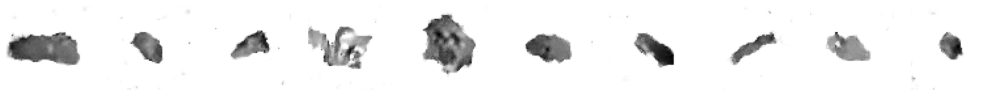

313/313 [==============================] - 47s 148ms/step - d_loss: -0.2069 - d_real_acc: 0.9202 - d_fake_acc: 0.9551 - d_acc: 0.9376 - g_loss: 6.1289 - g_acc: 0.0449
Epoch 86/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1048 - d_real_acc: 0.9060 - d_fake_acc: 0.9434 - d_acc: 0.9247 - g_loss: 5.8393 - g_acc: 0.0567
Saved to ./output/generated_img_085.png


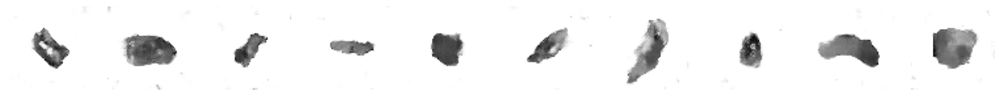

313/313 [==============================] - 47s 149ms/step - d_loss: -0.1048 - d_real_acc: 0.9060 - d_fake_acc: 0.9434 - d_acc: 0.9247 - g_loss: 5.8393 - g_acc: 0.0567
Epoch 87/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2485 - d_real_acc: 0.9307 - d_fake_acc: 0.9673 - d_acc: 0.9490 - g_loss: 5.9018 - g_acc: 0.0327
Saved to ./output/generated_img_086.png


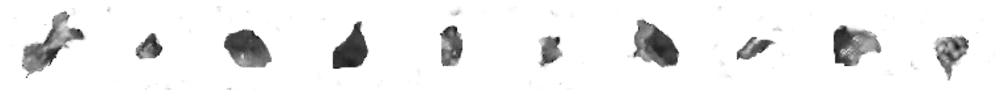

313/313 [==============================] - 46s 146ms/step - d_loss: -0.2485 - d_real_acc: 0.9307 - d_fake_acc: 0.9673 - d_acc: 0.9490 - g_loss: 5.9018 - g_acc: 0.0327
Epoch 88/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2124 - d_real_acc: 0.9213 - d_fake_acc: 0.9587 - d_acc: 0.9400 - g_loss: 6.0502 - g_acc: 0.0413
Saved to ./output/generated_img_087.png


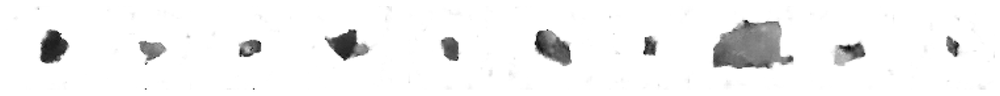

313/313 [==============================] - 46s 148ms/step - d_loss: -0.2124 - d_real_acc: 0.9213 - d_fake_acc: 0.9587 - d_acc: 0.9400 - g_loss: 6.0502 - g_acc: 0.0413
Epoch 89/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2300 - d_real_acc: 0.9217 - d_fake_acc: 0.9555 - d_acc: 0.9386 - g_loss: 6.3298 - g_acc: 0.0445
Saved to ./output/generated_img_088.png


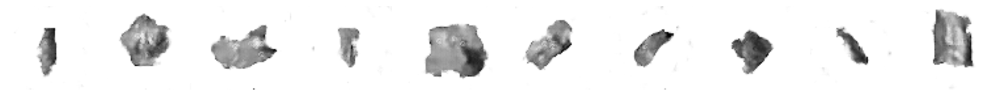

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2300 - d_real_acc: 0.9217 - d_fake_acc: 0.9555 - d_acc: 0.9386 - g_loss: 6.3298 - g_acc: 0.0445
Epoch 90/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2550 - d_real_acc: 0.9301 - d_fake_acc: 0.9661 - d_acc: 0.9481 - g_loss: 6.3167 - g_acc: 0.0340
Saved to ./output/generated_img_089.png


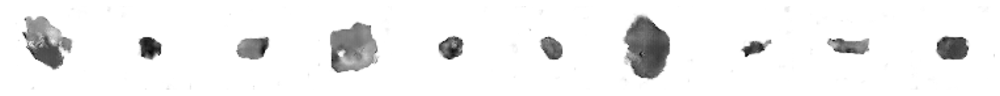

313/313 [==============================] - 47s 148ms/step - d_loss: -0.2550 - d_real_acc: 0.9301 - d_fake_acc: 0.9661 - d_acc: 0.9481 - g_loss: 6.3167 - g_acc: 0.0340
Epoch 91/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2289 - d_real_acc: 0.9234 - d_fake_acc: 0.9581 - d_acc: 0.9407 - g_loss: 6.5077 - g_acc: 0.0419
Saved to ./output/generated_img_090.png


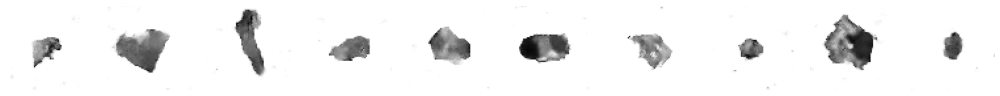

313/313 [==============================] - 47s 148ms/step - d_loss: -0.2289 - d_real_acc: 0.9234 - d_fake_acc: 0.9581 - d_acc: 0.9407 - g_loss: 6.5077 - g_acc: 0.0419
Epoch 92/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2472 - d_real_acc: 0.9240 - d_fake_acc: 0.9579 - d_acc: 0.9410 - g_loss: 6.5609 - g_acc: 0.0421
Saved to ./output/generated_img_091.png


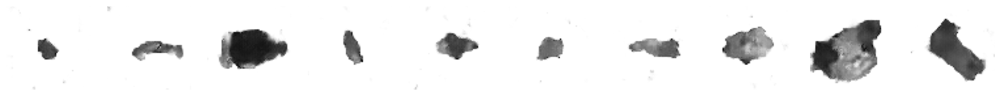

313/313 [==============================] - 47s 149ms/step - d_loss: -0.2472 - d_real_acc: 0.9240 - d_fake_acc: 0.9579 - d_acc: 0.9410 - g_loss: 6.5609 - g_acc: 0.0421
Epoch 93/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2036 - d_real_acc: 0.9182 - d_fake_acc: 0.9526 - d_acc: 0.9354 - g_loss: 6.4806 - g_acc: 0.0474
Saved to ./output/generated_img_092.png


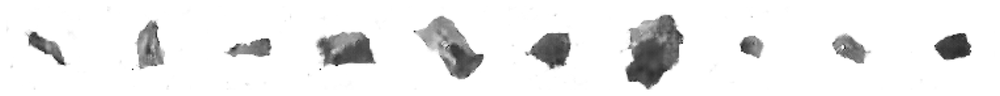

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2036 - d_real_acc: 0.9182 - d_fake_acc: 0.9526 - d_acc: 0.9354 - g_loss: 6.4806 - g_acc: 0.0474
Epoch 94/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2588 - d_real_acc: 0.9300 - d_fake_acc: 0.9654 - d_acc: 0.9477 - g_loss: 6.4916 - g_acc: 0.0347
Saved to ./output/generated_img_093.png


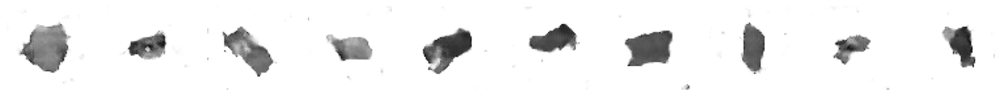

313/313 [==============================] - 46s 146ms/step - d_loss: -0.2588 - d_real_acc: 0.9300 - d_fake_acc: 0.9654 - d_acc: 0.9477 - g_loss: 6.4916 - g_acc: 0.0347
Epoch 95/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2539 - d_real_acc: 0.9273 - d_fake_acc: 0.9600 - d_acc: 0.9436 - g_loss: 6.6370 - g_acc: 0.0400
Saved to ./output/generated_img_094.png


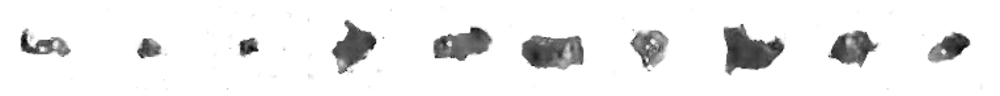

313/313 [==============================] - 47s 151ms/step - d_loss: -0.2539 - d_real_acc: 0.9273 - d_fake_acc: 0.9600 - d_acc: 0.9436 - g_loss: 6.6370 - g_acc: 0.0400
Epoch 96/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2257 - d_real_acc: 0.9233 - d_fake_acc: 0.9567 - d_acc: 0.9400 - g_loss: 6.4638 - g_acc: 0.0433
Saved to ./output/generated_img_095.png


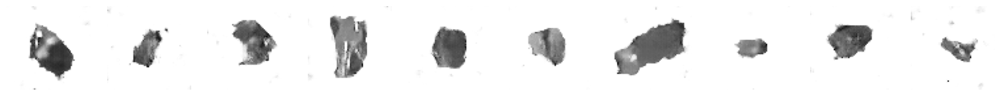

313/313 [==============================] - 47s 150ms/step - d_loss: -0.2257 - d_real_acc: 0.9233 - d_fake_acc: 0.9567 - d_acc: 0.9400 - g_loss: 6.4638 - g_acc: 0.0433
Epoch 97/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2749 - d_real_acc: 0.9287 - d_fake_acc: 0.9602 - d_acc: 0.9444 - g_loss: 6.9149 - g_acc: 0.0398
Saved to ./output/generated_img_096.png


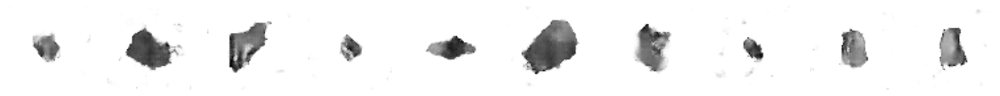

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2749 - d_real_acc: 0.9287 - d_fake_acc: 0.9602 - d_acc: 0.9444 - g_loss: 6.9149 - g_acc: 0.0398
Epoch 98/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2594 - d_real_acc: 0.9276 - d_fake_acc: 0.9620 - d_acc: 0.9448 - g_loss: 6.6447 - g_acc: 0.0381
Saved to ./output/generated_img_097.png


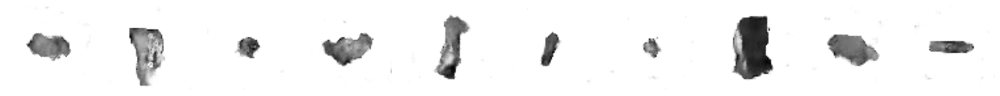

313/313 [==============================] - 45s 144ms/step - d_loss: -0.2594 - d_real_acc: 0.9276 - d_fake_acc: 0.9620 - d_acc: 0.9448 - g_loss: 6.6447 - g_acc: 0.0381
Epoch 99/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1840 - d_real_acc: 0.9166 - d_fake_acc: 0.9511 - d_acc: 0.9338 - g_loss: 6.3724 - g_acc: 0.0490
Saved to ./output/generated_img_098.png


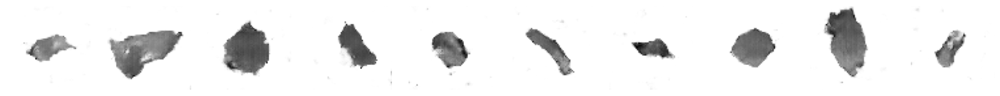

313/313 [==============================] - 45s 144ms/step - d_loss: -0.1840 - d_real_acc: 0.9166 - d_fake_acc: 0.9511 - d_acc: 0.9338 - g_loss: 6.3724 - g_acc: 0.0490
Epoch 100/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2114 - d_real_acc: 0.9185 - d_fake_acc: 0.9514 - d_acc: 0.9350 - g_loss: 6.6391 - g_acc: 0.0486
Saved to ./output/generated_img_099.png


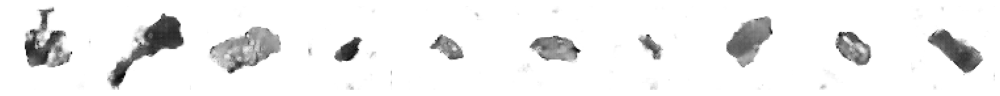

313/313 [==============================] - 46s 145ms/step - d_loss: -0.2114 - d_real_acc: 0.9185 - d_fake_acc: 0.9514 - d_acc: 0.9350 - g_loss: 6.6391 - g_acc: 0.0486
Epoch 101/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2547 - d_real_acc: 0.9262 - d_fake_acc: 0.9607 - d_acc: 0.9435 - g_loss: 6.7067 - g_acc: 0.0393
Saved to ./output/generated_img_100.png


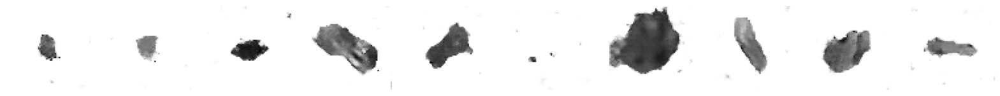

313/313 [==============================] - 46s 144ms/step - d_loss: -0.2547 - d_real_acc: 0.9262 - d_fake_acc: 0.9607 - d_acc: 0.9435 - g_loss: 6.7067 - g_acc: 0.0393
Epoch 102/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2839 - d_real_acc: 0.9326 - d_fake_acc: 0.9655 - d_acc: 0.9490 - g_loss: 6.9111 - g_acc: 0.0345
Saved to ./output/generated_img_101.png


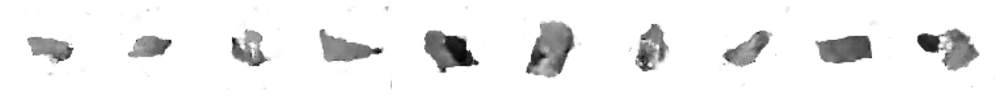

313/313 [==============================] - 45s 144ms/step - d_loss: -0.2839 - d_real_acc: 0.9326 - d_fake_acc: 0.9655 - d_acc: 0.9490 - g_loss: 6.9111 - g_acc: 0.0345
Epoch 103/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2518 - d_real_acc: 0.9251 - d_fake_acc: 0.9558 - d_acc: 0.9404 - g_loss: 7.0063 - g_acc: 0.0443
Saved to ./output/generated_img_102.png


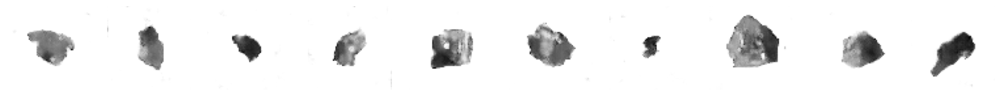

313/313 [==============================] - 46s 146ms/step - d_loss: -0.2518 - d_real_acc: 0.9251 - d_fake_acc: 0.9558 - d_acc: 0.9404 - g_loss: 7.0063 - g_acc: 0.0443
Epoch 104/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3182 - d_real_acc: 0.9395 - d_fake_acc: 0.9705 - d_acc: 0.9550 - g_loss: 7.0984 - g_acc: 0.0295
Saved to ./output/generated_img_103.png


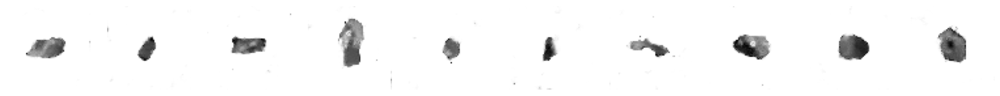

313/313 [==============================] - 46s 147ms/step - d_loss: -0.3182 - d_real_acc: 0.9395 - d_fake_acc: 0.9705 - d_acc: 0.9550 - g_loss: 7.0984 - g_acc: 0.0295
Epoch 105/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1040 - d_real_acc: 0.9013 - d_fake_acc: 0.9370 - d_acc: 0.9192 - g_loss: 6.6365 - g_acc: 0.0630
Saved to ./output/generated_img_104.png


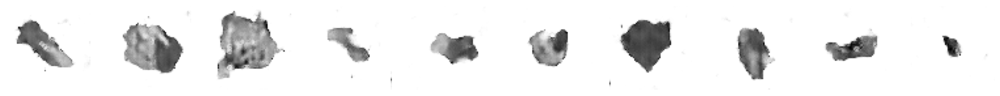

313/313 [==============================] - 46s 147ms/step - d_loss: -0.1040 - d_real_acc: 0.9013 - d_fake_acc: 0.9370 - d_acc: 0.9192 - g_loss: 6.6365 - g_acc: 0.0630
Epoch 106/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2724 - d_real_acc: 0.9328 - d_fake_acc: 0.9665 - d_acc: 0.9497 - g_loss: 6.5111 - g_acc: 0.0335
Saved to ./output/generated_img_105.png


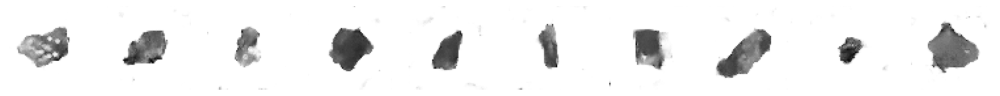

313/313 [==============================] - 46s 145ms/step - d_loss: -0.2724 - d_real_acc: 0.9328 - d_fake_acc: 0.9665 - d_acc: 0.9497 - g_loss: 6.5111 - g_acc: 0.0335
Epoch 107/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2597 - d_real_acc: 0.9287 - d_fake_acc: 0.9622 - d_acc: 0.9454 - g_loss: 6.8230 - g_acc: 0.0378
Saved to ./output/generated_img_106.png


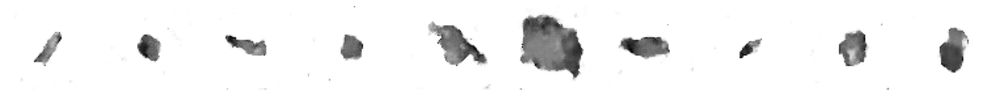

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2597 - d_real_acc: 0.9287 - d_fake_acc: 0.9622 - d_acc: 0.9454 - g_loss: 6.8230 - g_acc: 0.0378
Epoch 108/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2379 - d_real_acc: 0.9257 - d_fake_acc: 0.9596 - d_acc: 0.9426 - g_loss: 6.6883 - g_acc: 0.0405
Saved to ./output/generated_img_107.png


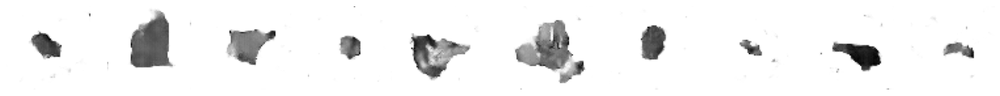

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2379 - d_real_acc: 0.9257 - d_fake_acc: 0.9596 - d_acc: 0.9426 - g_loss: 6.6883 - g_acc: 0.0405
Epoch 109/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2678 - d_real_acc: 0.9295 - d_fake_acc: 0.9606 - d_acc: 0.9451 - g_loss: 6.8339 - g_acc: 0.0394
Saved to ./output/generated_img_108.png


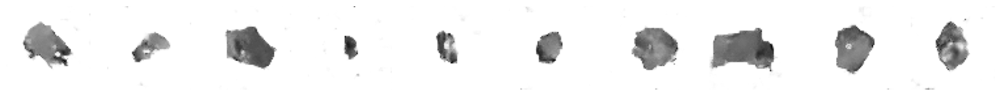

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2678 - d_real_acc: 0.9295 - d_fake_acc: 0.9606 - d_acc: 0.9451 - g_loss: 6.8339 - g_acc: 0.0394
Epoch 110/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2020 - d_real_acc: 0.9188 - d_fake_acc: 0.9495 - d_acc: 0.9342 - g_loss: 7.0980 - g_acc: 0.0505
Saved to ./output/generated_img_109.png


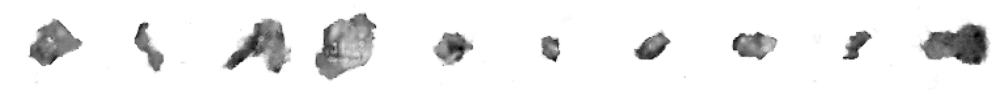

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2020 - d_real_acc: 0.9188 - d_fake_acc: 0.9495 - d_acc: 0.9342 - g_loss: 7.0980 - g_acc: 0.0505
Epoch 111/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2737 - d_real_acc: 0.9306 - d_fake_acc: 0.9652 - d_acc: 0.9479 - g_loss: 6.5884 - g_acc: 0.0349
Saved to ./output/generated_img_110.png


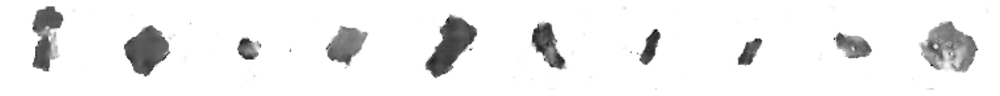

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2737 - d_real_acc: 0.9306 - d_fake_acc: 0.9652 - d_acc: 0.9479 - g_loss: 6.5884 - g_acc: 0.0349
Epoch 112/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2682 - d_real_acc: 0.9290 - d_fake_acc: 0.9610 - d_acc: 0.9450 - g_loss: 7.0574 - g_acc: 0.0391
Saved to ./output/generated_img_111.png


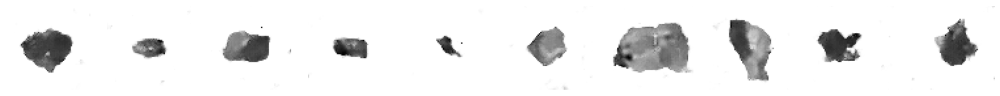

313/313 [==============================] - 46s 147ms/step - d_loss: -0.2682 - d_real_acc: 0.9290 - d_fake_acc: 0.9610 - d_acc: 0.9450 - g_loss: 7.0574 - g_acc: 0.0391
Epoch 113/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2965 - d_real_acc: 0.9321 - d_fake_acc: 0.9634 - d_acc: 0.9477 - g_loss: 7.3162 - g_acc: 0.0367
Saved to ./output/generated_img_112.png


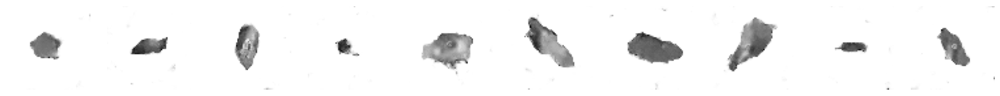

313/313 [==============================] - 46s 146ms/step - d_loss: -0.2965 - d_real_acc: 0.9321 - d_fake_acc: 0.9634 - d_acc: 0.9477 - g_loss: 7.3162 - g_acc: 0.0367
Epoch 114/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2957 - d_real_acc: 0.9345 - d_fake_acc: 0.9663 - d_acc: 0.9504 - g_loss: 7.0404 - g_acc: 0.0337
Saved to ./output/generated_img_113.png


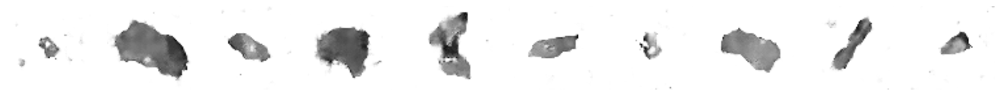

313/313 [==============================] - 47s 148ms/step - d_loss: -0.2957 - d_real_acc: 0.9345 - d_fake_acc: 0.9663 - d_acc: 0.9504 - g_loss: 7.0404 - g_acc: 0.0337
Epoch 115/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2665 - d_real_acc: 0.9272 - d_fake_acc: 0.9568 - d_acc: 0.9420 - g_loss: 7.1501 - g_acc: 0.0432
Saved to ./output/generated_img_114.png


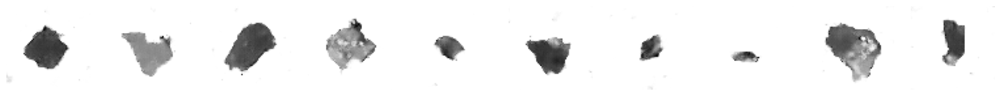

313/313 [==============================] - 46s 145ms/step - d_loss: -0.2665 - d_real_acc: 0.9272 - d_fake_acc: 0.9568 - d_acc: 0.9420 - g_loss: 7.1501 - g_acc: 0.0432
Epoch 116/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2769 - d_real_acc: 0.9283 - d_fake_acc: 0.9594 - d_acc: 0.9439 - g_loss: 7.2353 - g_acc: 0.0406
Saved to ./output/generated_img_115.png


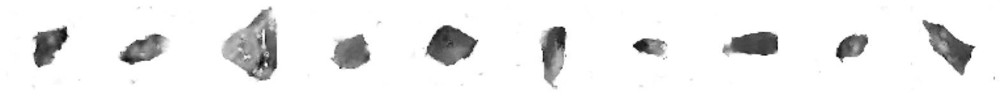

313/313 [==============================] - 45s 144ms/step - d_loss: -0.2769 - d_real_acc: 0.9283 - d_fake_acc: 0.9594 - d_acc: 0.9439 - g_loss: 7.2353 - g_acc: 0.0406
Epoch 117/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2729 - d_real_acc: 0.9279 - d_fake_acc: 0.9595 - d_acc: 0.9437 - g_loss: 7.2413 - g_acc: 0.0405
Saved to ./output/generated_img_116.png


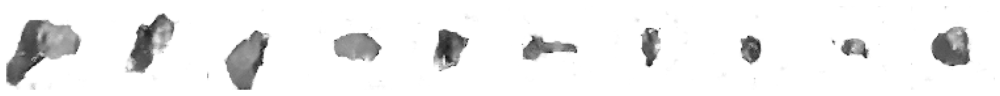

313/313 [==============================] - 45s 142ms/step - d_loss: -0.2729 - d_real_acc: 0.9279 - d_fake_acc: 0.9595 - d_acc: 0.9437 - g_loss: 7.2413 - g_acc: 0.0405
Epoch 118/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3120 - d_real_acc: 0.9357 - d_fake_acc: 0.9677 - d_acc: 0.9517 - g_loss: 7.2586 - g_acc: 0.0323
Saved to ./output/generated_img_117.png


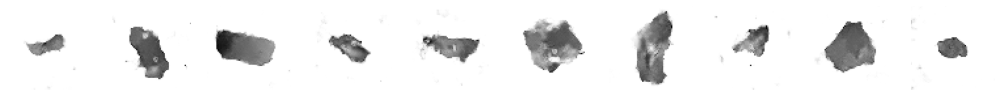

313/313 [==============================] - 44s 141ms/step - d_loss: -0.3120 - d_real_acc: 0.9357 - d_fake_acc: 0.9677 - d_acc: 0.9517 - g_loss: 7.2586 - g_acc: 0.0323
Epoch 119/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3261 - d_real_acc: 0.9359 - d_fake_acc: 0.9658 - d_acc: 0.9509 - g_loss: 7.6126 - g_acc: 0.0342
Saved to ./output/generated_img_118.png


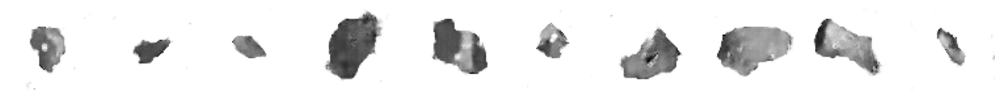

313/313 [==============================] - 44s 138ms/step - d_loss: -0.3261 - d_real_acc: 0.9359 - d_fake_acc: 0.9658 - d_acc: 0.9509 - g_loss: 7.6126 - g_acc: 0.0342
Epoch 120/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2764 - d_real_acc: 0.9281 - d_fake_acc: 0.9579 - d_acc: 0.9430 - g_loss: 7.5059 - g_acc: 0.0421
Saved to ./output/generated_img_119.png


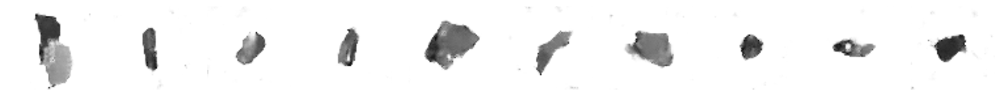

313/313 [==============================] - 43s 137ms/step - d_loss: -0.2764 - d_real_acc: 0.9281 - d_fake_acc: 0.9579 - d_acc: 0.9430 - g_loss: 7.5059 - g_acc: 0.0421
Epoch 121/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3040 - d_real_acc: 0.9352 - d_fake_acc: 0.9642 - d_acc: 0.9497 - g_loss: 7.6122 - g_acc: 0.0358
Saved to ./output/generated_img_120.png


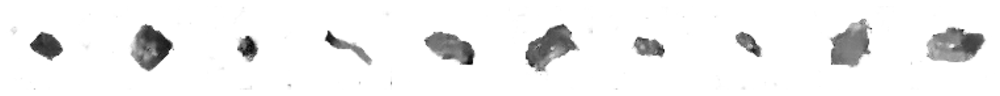

313/313 [==============================] - 43s 136ms/step - d_loss: -0.3040 - d_real_acc: 0.9352 - d_fake_acc: 0.9642 - d_acc: 0.9497 - g_loss: 7.6122 - g_acc: 0.0358
Epoch 122/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2807 - d_real_acc: 0.9317 - d_fake_acc: 0.9610 - d_acc: 0.9464 - g_loss: 7.6319 - g_acc: 0.0390
Saved to ./output/generated_img_121.png


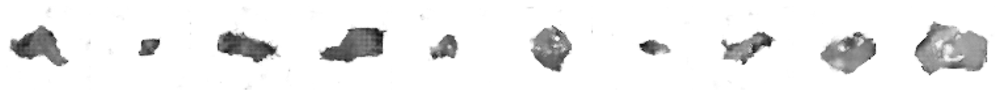

313/313 [==============================] - 43s 136ms/step - d_loss: -0.2807 - d_real_acc: 0.9317 - d_fake_acc: 0.9610 - d_acc: 0.9464 - g_loss: 7.6319 - g_acc: 0.0390
Epoch 123/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3105 - d_real_acc: 0.9348 - d_fake_acc: 0.9682 - d_acc: 0.9515 - g_loss: 7.2804 - g_acc: 0.0318
Saved to ./output/generated_img_122.png


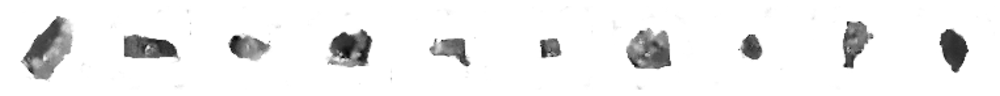

313/313 [==============================] - 43s 135ms/step - d_loss: -0.3105 - d_real_acc: 0.9348 - d_fake_acc: 0.9682 - d_acc: 0.9515 - g_loss: 7.2804 - g_acc: 0.0318
Epoch 124/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2223 - d_real_acc: 0.9185 - d_fake_acc: 0.9488 - d_acc: 0.9337 - g_loss: 7.4770 - g_acc: 0.0512
Saved to ./output/generated_img_123.png


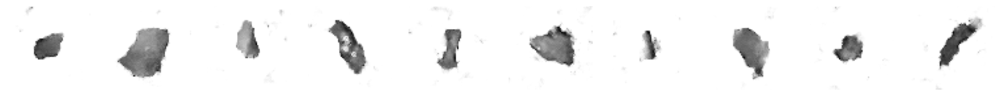

313/313 [==============================] - 42s 134ms/step - d_loss: -0.2223 - d_real_acc: 0.9185 - d_fake_acc: 0.9488 - d_acc: 0.9337 - g_loss: 7.4770 - g_acc: 0.0512
Epoch 125/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3205 - d_real_acc: 0.9364 - d_fake_acc: 0.9667 - d_acc: 0.9516 - g_loss: 7.4486 - g_acc: 0.0333
Saved to ./output/generated_img_124.png


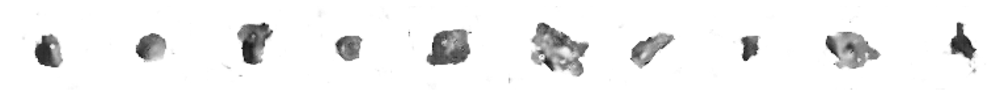

313/313 [==============================] - 42s 134ms/step - d_loss: -0.3205 - d_real_acc: 0.9364 - d_fake_acc: 0.9667 - d_acc: 0.9516 - g_loss: 7.4486 - g_acc: 0.0333
Epoch 126/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2858 - d_real_acc: 0.9293 - d_fake_acc: 0.9616 - d_acc: 0.9455 - g_loss: 7.4948 - g_acc: 0.0384
Saved to ./output/generated_img_125.png


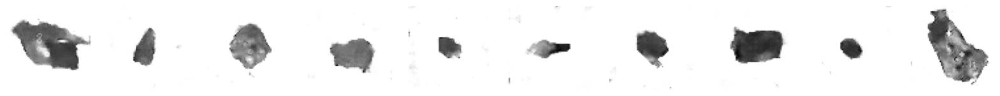

313/313 [==============================] - 45s 141ms/step - d_loss: -0.2858 - d_real_acc: 0.9293 - d_fake_acc: 0.9616 - d_acc: 0.9455 - g_loss: 7.4948 - g_acc: 0.0384
Epoch 127/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3094 - d_real_acc: 0.9329 - d_fake_acc: 0.9627 - d_acc: 0.9478 - g_loss: 7.7487 - g_acc: 0.0373
Saved to ./output/generated_img_126.png


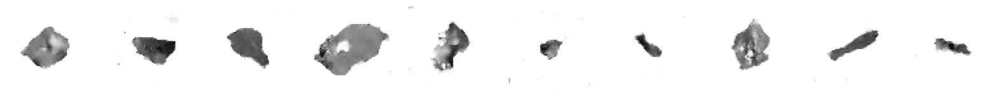

313/313 [==============================] - 45s 141ms/step - d_loss: -0.3094 - d_real_acc: 0.9329 - d_fake_acc: 0.9627 - d_acc: 0.9478 - g_loss: 7.7487 - g_acc: 0.0373
Epoch 128/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2772 - d_real_acc: 0.9304 - d_fake_acc: 0.9625 - d_acc: 0.9464 - g_loss: 7.3574 - g_acc: 0.0375
Saved to ./output/generated_img_127.png


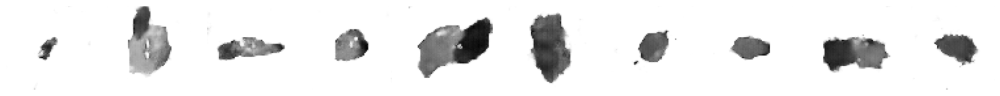

313/313 [==============================] - 45s 142ms/step - d_loss: -0.2772 - d_real_acc: 0.9304 - d_fake_acc: 0.9625 - d_acc: 0.9464 - g_loss: 7.3574 - g_acc: 0.0375
Epoch 129/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2666 - d_real_acc: 0.9281 - d_fake_acc: 0.9594 - d_acc: 0.9437 - g_loss: 7.4650 - g_acc: 0.0406
Saved to ./output/generated_img_128.png


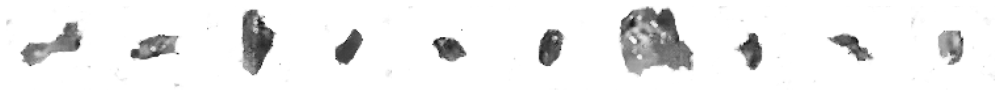

313/313 [==============================] - 45s 143ms/step - d_loss: -0.2666 - d_real_acc: 0.9281 - d_fake_acc: 0.9594 - d_acc: 0.9437 - g_loss: 7.4650 - g_acc: 0.0406
Epoch 130/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3243 - d_real_acc: 0.9366 - d_fake_acc: 0.9666 - d_acc: 0.9516 - g_loss: 7.6440 - g_acc: 0.0334
Saved to ./output/generated_img_129.png


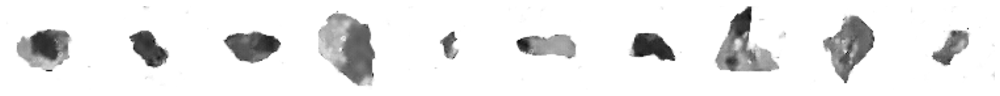

313/313 [==============================] - 46s 145ms/step - d_loss: -0.3243 - d_real_acc: 0.9366 - d_fake_acc: 0.9666 - d_acc: 0.9516 - g_loss: 7.6440 - g_acc: 0.0334
Epoch 131/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2134 - d_real_acc: 0.9187 - d_fake_acc: 0.9504 - d_acc: 0.9346 - g_loss: 7.4185 - g_acc: 0.0496
Saved to ./output/generated_img_130.png


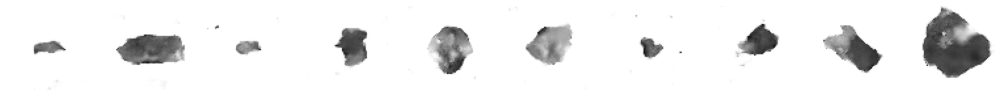

313/313 [==============================] - 45s 144ms/step - d_loss: -0.2134 - d_real_acc: 0.9187 - d_fake_acc: 0.9504 - d_acc: 0.9346 - g_loss: 7.4185 - g_acc: 0.0496
Epoch 132/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3489 - d_real_acc: 0.9410 - d_fake_acc: 0.9713 - d_acc: 0.9561 - g_loss: 7.5190 - g_acc: 0.0288
Saved to ./output/generated_img_131.png


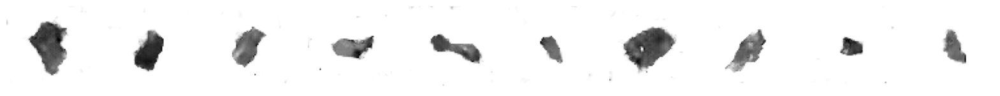

313/313 [==============================] - 45s 144ms/step - d_loss: -0.3489 - d_real_acc: 0.9410 - d_fake_acc: 0.9713 - d_acc: 0.9561 - g_loss: 7.5190 - g_acc: 0.0288
Epoch 133/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3045 - d_real_acc: 0.9335 - d_fake_acc: 0.9644 - d_acc: 0.9489 - g_loss: 7.6504 - g_acc: 0.0356
Saved to ./output/generated_img_132.png


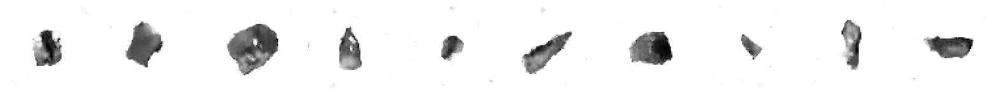

313/313 [==============================] - 261s 834ms/step - d_loss: -0.3045 - d_real_acc: 0.9335 - d_fake_acc: 0.9644 - d_acc: 0.9489 - g_loss: 7.6504 - g_acc: 0.0356
Epoch 134/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3335 - d_real_acc: 0.9389 - d_fake_acc: 0.9689 - d_acc: 0.9539 - g_loss: 7.6012 - g_acc: 0.0311
Saved to ./output/generated_img_133.png


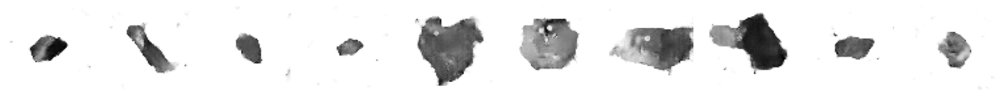

313/313 [==============================] - 956s 3s/step - d_loss: -0.3335 - d_real_acc: 0.9389 - d_fake_acc: 0.9689 - d_acc: 0.9539 - g_loss: 7.6012 - g_acc: 0.0311
Epoch 135/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3114 - d_real_acc: 0.9336 - d_fake_acc: 0.9632 - d_acc: 0.9484 - g_loss: 7.8401 - g_acc: 0.0368
Saved to ./output/generated_img_134.png


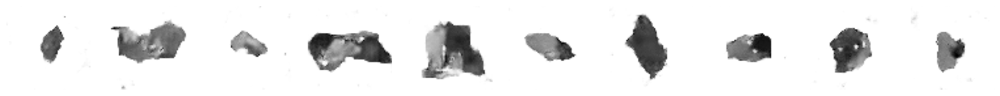

313/313 [==============================] - 55s 176ms/step - d_loss: -0.3114 - d_real_acc: 0.9336 - d_fake_acc: 0.9632 - d_acc: 0.9484 - g_loss: 7.8401 - g_acc: 0.0368
Epoch 136/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3061 - d_real_acc: 0.9330 - d_fake_acc: 0.9626 - d_acc: 0.9478 - g_loss: 7.7328 - g_acc: 0.0374
Saved to ./output/generated_img_135.png


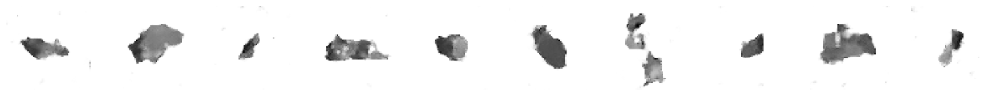

313/313 [==============================] - 42s 132ms/step - d_loss: -0.3061 - d_real_acc: 0.9330 - d_fake_acc: 0.9626 - d_acc: 0.9478 - g_loss: 7.7328 - g_acc: 0.0374
Epoch 137/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3164 - d_real_acc: 0.9354 - d_fake_acc: 0.9655 - d_acc: 0.9504 - g_loss: 7.8603 - g_acc: 0.0345
Saved to ./output/generated_img_136.png


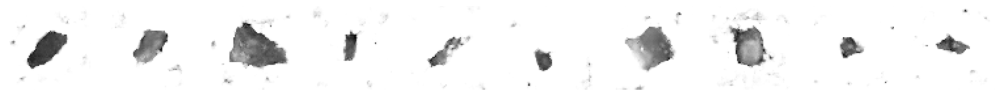

313/313 [==============================] - 41s 130ms/step - d_loss: -0.3164 - d_real_acc: 0.9354 - d_fake_acc: 0.9655 - d_acc: 0.9504 - g_loss: 7.8603 - g_acc: 0.0345
Epoch 138/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2676 - d_real_acc: 0.9279 - d_fake_acc: 0.9596 - d_acc: 0.9437 - g_loss: 7.2412 - g_acc: 0.0404
Saved to ./output/generated_img_137.png


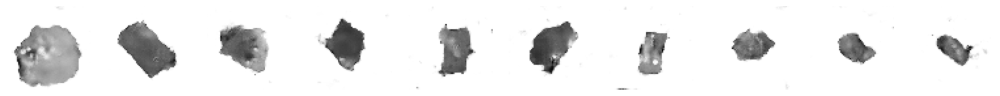

313/313 [==============================] - 41s 131ms/step - d_loss: -0.2676 - d_real_acc: 0.9279 - d_fake_acc: 0.9596 - d_acc: 0.9437 - g_loss: 7.2412 - g_acc: 0.0404
Epoch 139/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3167 - d_real_acc: 0.9354 - d_fake_acc: 0.9636 - d_acc: 0.9495 - g_loss: 7.7377 - g_acc: 0.0364
Saved to ./output/generated_img_138.png


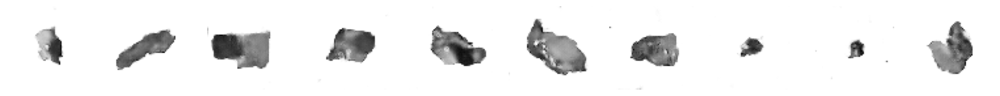

313/313 [==============================] - 41s 131ms/step - d_loss: -0.3167 - d_real_acc: 0.9354 - d_fake_acc: 0.9636 - d_acc: 0.9495 - g_loss: 7.7377 - g_acc: 0.0364
Epoch 140/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2420 - d_real_acc: 0.9218 - d_fake_acc: 0.9524 - d_acc: 0.9371 - g_loss: 7.6193 - g_acc: 0.0476
Saved to ./output/generated_img_139.png


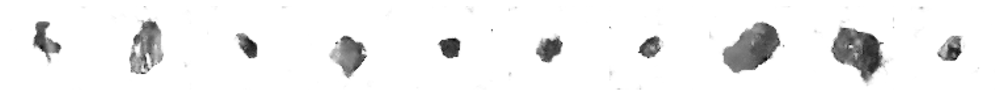

313/313 [==============================] - 41s 131ms/step - d_loss: -0.2420 - d_real_acc: 0.9218 - d_fake_acc: 0.9524 - d_acc: 0.9371 - g_loss: 7.6193 - g_acc: 0.0476
Epoch 141/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2327 - d_real_acc: 0.9223 - d_fake_acc: 0.9556 - d_acc: 0.9389 - g_loss: 7.1979 - g_acc: 0.0444
Saved to ./output/generated_img_140.png


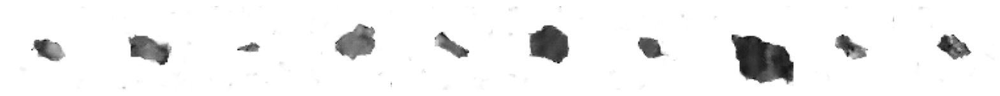

313/313 [==============================] - 41s 130ms/step - d_loss: -0.2327 - d_real_acc: 0.9223 - d_fake_acc: 0.9556 - d_acc: 0.9389 - g_loss: 7.1979 - g_acc: 0.0444
Epoch 142/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3370 - d_real_acc: 0.9397 - d_fake_acc: 0.9706 - d_acc: 0.9551 - g_loss: 7.4948 - g_acc: 0.0294
Saved to ./output/generated_img_141.png


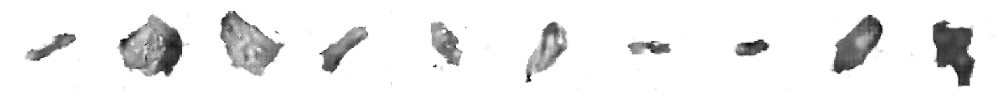

313/313 [==============================] - 41s 130ms/step - d_loss: -0.3370 - d_real_acc: 0.9397 - d_fake_acc: 0.9706 - d_acc: 0.9551 - g_loss: 7.4948 - g_acc: 0.0294
Epoch 143/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2312 - d_real_acc: 0.9208 - d_fake_acc: 0.9529 - d_acc: 0.9368 - g_loss: 7.4133 - g_acc: 0.0471
Saved to ./output/generated_img_142.png


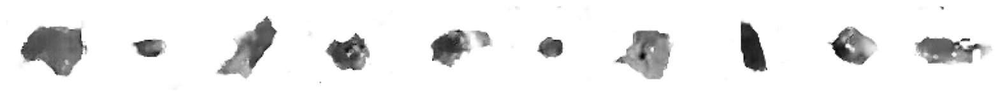

313/313 [==============================] - 41s 131ms/step - d_loss: -0.2312 - d_real_acc: 0.9208 - d_fake_acc: 0.9529 - d_acc: 0.9368 - g_loss: 7.4133 - g_acc: 0.0471
Epoch 144/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3274 - d_real_acc: 0.9399 - d_fake_acc: 0.9707 - d_acc: 0.9553 - g_loss: 7.4777 - g_acc: 0.0293
Saved to ./output/generated_img_143.png


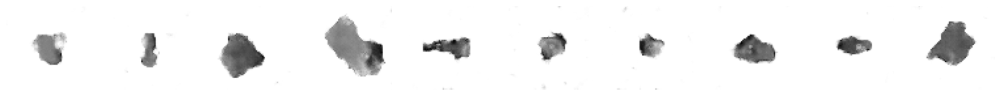

313/313 [==============================] - 41s 131ms/step - d_loss: -0.3274 - d_real_acc: 0.9399 - d_fake_acc: 0.9707 - d_acc: 0.9553 - g_loss: 7.4777 - g_acc: 0.0293
Epoch 145/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2835 - d_real_acc: 0.9298 - d_fake_acc: 0.9599 - d_acc: 0.9448 - g_loss: 7.5345 - g_acc: 0.0401
Saved to ./output/generated_img_144.png


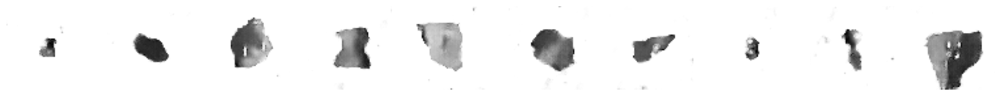

313/313 [==============================] - 42s 133ms/step - d_loss: -0.2835 - d_real_acc: 0.9298 - d_fake_acc: 0.9599 - d_acc: 0.9448 - g_loss: 7.5345 - g_acc: 0.0401
Epoch 146/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3067 - d_real_acc: 0.9339 - d_fake_acc: 0.9619 - d_acc: 0.9479 - g_loss: 7.8169 - g_acc: 0.0381
Saved to ./output/generated_img_145.png


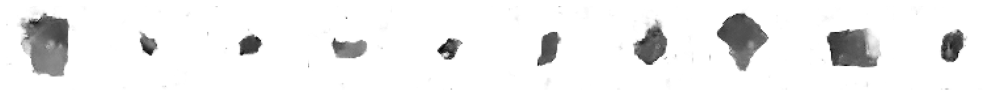

313/313 [==============================] - 41s 132ms/step - d_loss: -0.3067 - d_real_acc: 0.9339 - d_fake_acc: 0.9619 - d_acc: 0.9479 - g_loss: 7.8169 - g_acc: 0.0381
Epoch 147/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3354 - d_real_acc: 0.9376 - d_fake_acc: 0.9668 - d_acc: 0.9522 - g_loss: 7.9839 - g_acc: 0.0332
Saved to ./output/generated_img_146.png


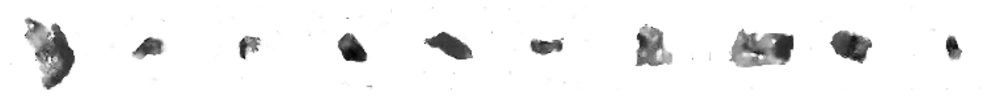

313/313 [==============================] - 41s 130ms/step - d_loss: -0.3354 - d_real_acc: 0.9376 - d_fake_acc: 0.9668 - d_acc: 0.9522 - g_loss: 7.9839 - g_acc: 0.0332
Epoch 148/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3519 - d_real_acc: 0.9405 - d_fake_acc: 0.9687 - d_acc: 0.9546 - g_loss: 7.9826 - g_acc: 0.0313
Saved to ./output/generated_img_147.png


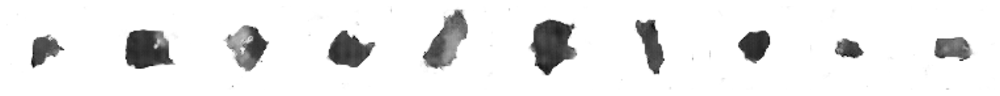

313/313 [==============================] - 41s 130ms/step - d_loss: -0.3519 - d_real_acc: 0.9405 - d_fake_acc: 0.9687 - d_acc: 0.9546 - g_loss: 7.9826 - g_acc: 0.0313
Epoch 149/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2984 - d_real_acc: 0.9320 - d_fake_acc: 0.9607 - d_acc: 0.9463 - g_loss: 7.8378 - g_acc: 0.0393
Saved to ./output/generated_img_148.png


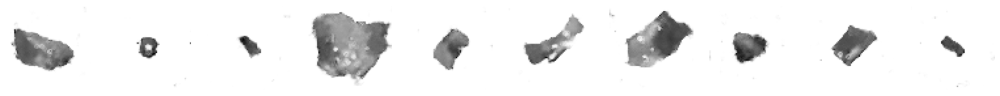

313/313 [==============================] - 41s 131ms/step - d_loss: -0.2984 - d_real_acc: 0.9320 - d_fake_acc: 0.9607 - d_acc: 0.9463 - g_loss: 7.8378 - g_acc: 0.0393
Epoch 150/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2434 - d_real_acc: 0.9248 - d_fake_acc: 0.9537 - d_acc: 0.9392 - g_loss: 7.9132 - g_acc: 0.0463
Saved to ./output/generated_img_149.png


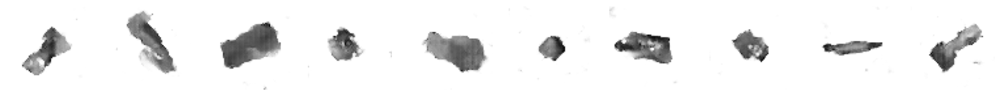

313/313 [==============================] - 41s 130ms/step - d_loss: -0.2434 - d_real_acc: 0.9248 - d_fake_acc: 0.9537 - d_acc: 0.9392 - g_loss: 7.9132 - g_acc: 0.0463
Epoch 151/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2310 - d_real_acc: 0.9215 - d_fake_acc: 0.9534 - d_acc: 0.9374 - g_loss: 7.3403 - g_acc: 0.0467
Saved to ./output/generated_img_150.png


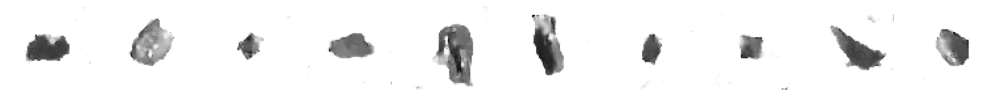

313/313 [==============================] - 41s 130ms/step - d_loss: -0.2310 - d_real_acc: 0.9215 - d_fake_acc: 0.9534 - d_acc: 0.9374 - g_loss: 7.3403 - g_acc: 0.0467
Epoch 152/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3356 - d_real_acc: 0.9385 - d_fake_acc: 0.9701 - d_acc: 0.9543 - g_loss: 7.5583 - g_acc: 0.0299
Saved to ./output/generated_img_151.png


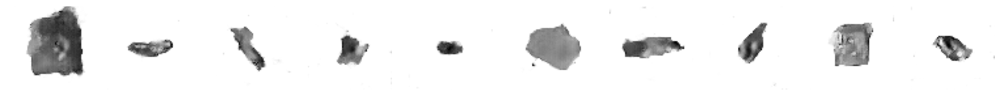

313/313 [==============================] - 41s 130ms/step - d_loss: -0.3356 - d_real_acc: 0.9385 - d_fake_acc: 0.9701 - d_acc: 0.9543 - g_loss: 7.5583 - g_acc: 0.0299
Epoch 153/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3073 - d_real_acc: 0.9331 - d_fake_acc: 0.9631 - d_acc: 0.9481 - g_loss: 7.8278 - g_acc: 0.0369
Saved to ./output/generated_img_152.png


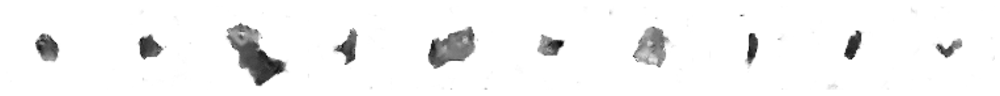

313/313 [==============================] - 41s 132ms/step - d_loss: -0.3073 - d_real_acc: 0.9331 - d_fake_acc: 0.9631 - d_acc: 0.9481 - g_loss: 7.8278 - g_acc: 0.0369
Epoch 154/300
117/313 [==========>...................] - ETA: 25s - d_loss: -0.3230 - d_real_acc: 0.9348 - d_fake_acc: 0.9654 - d_acc: 0.9501 - g_loss: 7.7974 - g_acc: 0.0346

KeyboardInterrupt: 

In [14]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [ ]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

## 3. Generate new images <a name="decode"></a>

In [ ]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [ ]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

In [ ]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [ ]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [ ]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

In [ ]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

In [ ]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()